In [8]:
# ==========================================
# 1. Configuración y librerías
# ==========================================
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet
from prophet.diagnostics import cross_validation, performance_metrics
from prophet.plot import plot_cross_validation_metric
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import itertools, json, joblib, warnings, statsmodels.api as sm
warnings.filterwarnings("ignore")

# ------------------------------------------
# 2. Carga y preprocesado de datos
# ------------------------------------------
CSV_PATH = "dataset_produccion.csv"
CASA_ID  = 5558            # <— cambia si entrenas otra casa

df = pd.read_csv(CSV_PATH, parse_dates=["datetime"])
df = df[df["id_casa"] == CASA_ID]
assert not df.empty, "No hay registros para esa casa."

# Agregación diaria
df["fecha"] = df["datetime"].dt.date
agg = {
    "produccion_kWh": "sum",
    "num_placas": "first",
    "irradiancia_W_m2": "mean",
    "temperatura": "mean",
    "nubosidad": "mean",
}
daily = df.groupby("fecha", as_index=False).agg(agg).sort_values("fecha")
daily["prod_placa"] = daily["produccion_kWh"] / daily["num_placas"]

# Log‑transform objetivo
daily["ds"] = pd.to_datetime(daily["fecha"])
daily["y"]  = np.log1p(daily["prod_placa"])

# Lags y regresores
daily["lag1"] = daily["y"].shift(1).bfill()
daily["lag7"] = daily["y"].shift(7).bfill()

reg_cols = ["irradiancia_W_m2", "temperatura", "nubosidad", "lag1", "lag7"]

# ------------------------------------------
# 3. Búsqueda de hiperparámetros (Grid)
# ------------------------------------------
param_grid = {                     # Parámetros a explorar
    'changepoint_prior_scale': [0.01, 0.05, 0.1, 0.3],
    'seasonality_prior_scale': [10, 20],
    'seasonality_mode':        ['additive', 'multiplicative'],
    'mcmc_samples':            [0, 200]     # 0 = variational; 200 = full‑Bayes
}

# Todas las combinaciones
all_params = [dict(zip(param_grid.keys(), v))
              for v in itertools.product(*param_grid.values())]

results = []        # ← guardará (params, MAPE)
print(f"🔍 Evaluando {len(all_params)} combinaciones…")

for i, params in enumerate(all_params, 1):
    m = Prophet(
        growth="linear",
        changepoint_prior_scale=params["changepoint_prior_scale"],
        seasonality_prior_scale=params["seasonality_prior_scale"],
        seasonality_mode=params["seasonality_mode"],
        mcmc_samples=params["mcmc_samples"],
        interval_width=0.90,
    )
    m.add_seasonality("anio", period=365.25, fourier_order=10)
    m.add_seasonality("semana", period=7, fourier_order=8)
    for c in reg_cols:
        m.add_regressor(c)

    m.fit(daily[["ds", "y"] + reg_cols])

    # -------- Cross‑validation --------
    df_cv = cross_validation(
        m,
        initial=f"{int(len(daily)*0.5)} days",   # 1ª mitad para entreno
        period="30 days",
        horizon="90 days",
        parallel="processes",
    )

    # -------- MAPE manual (ignora y==0) --------
    abs_perc_err = (
        np.abs(df_cv["y"] - df_cv["yhat"])
        / df_cv["y"].replace(0, np.nan).abs()
    )
    mape_val = abs_perc_err.mean() * 100

    results.append((params, mape_val))
    print(f"{i:02d}/{len(all_params)}  MAPE={mape_val:.2f}%  {params}")


# Elegir mejor
best_params, best_mape = min(results, key=lambda t: t[1])
print("\n🏆  Mejores hiperparámetros:", best_params, f"con MAPE={best_mape:.3f}")

# ------------------------------------------
# 4. Entrenamiento final con mejores params
# ------------------------------------------
best = Prophet(
    changepoint_prior_scale = best_params['changepoint_prior_scale'],
    seasonality_prior_scale = best_params['seasonality_prior_scale'],
    seasonality_mode        = best_params['seasonality_mode'],
    mcmc_samples            = best_params['mcmc_samples'],
    interval_width          = 0.90
)
best.add_seasonality("anio", period=365.25, fourier_order=10)
best.add_seasonality("semana", period=7, fourier_order=8)
for c in reg_cols:
    best.add_regressor(c)

best.fit(daily[["ds", "y"] + reg_cols])

# ------------------------------------------
# 5. Evaluación hold‑out (últimos 6 meses)
# ------------------------------------------
test_size = 180
train_df  = daily.iloc[:-test_size]
test_df   = daily.iloc[-test_size:]

best = best.copy()            # Prophet ya está entrenado con todo daily,
                              # para hold‑out volvemos a entrenar con train_df:
best.fit(train_df[["ds", "y"] + reg_cols])

future = test_df[["ds"] + reg_cols]
fcst   = best.predict(future)

# Des‑log
y_real  = np.expm1(test_df["y"])
y_pred  = np.expm1(fcst["yhat"])
lower   = np.expm1(fcst["yhat_lower"])
upper   = np.expm1(fcst["yhat_upper"])

# Métricas
mae   = mean_absolute_error(y_real, y_pred)
rmse  = mean_squared_error(y_real, y_pred, squared=False)
mape  = np.mean(np.abs((y_real - y_pred) / y_real)) * 100
smape = 100/len(y_real) * np.sum(2*np.abs(y_real - y_pred)/(np.abs(y_real)+np.abs(y_pred)))
r2    = r2_score(y_real, y_pred)
coverage = np.mean((y_real >= lower) & (y_real <= upper)) * 100

print(f"""
=======  Hold‑out (últimos {test_size} días)  =======
MAE    = {mae:.4f} kWh/placa
RMSE   = {rmse:.4f}
MAPE   = {mape:.2f} %
sMAPE  = {smape:.2f} %
R²     = {r2:.3f}
Coverage IC 90 % = {coverage:.1f} %
""")

# ------------------------------------------
# 6. Diagnóstico de residuos
# ------------------------------------------
resid   = y_real - y_pred
fig, ax = plt.subplots(1, 2, figsize=(12,4))
sns.lineplot(x=test_df["ds"], y=resid, ax=ax[0])
ax[0].axhline(0, ls='--', c='r'); ax[0].set_title("Residuos vs tiempo")

sm.graphics.tsa.plot_acf(resid, lags=30, ax=ax[1])
ax[1].set_title("ACF residuos")
plt.tight_layout(); plt.show()

# QQ‑plot para normalidad
sm.qqplot(resid, line='s')
plt.title("QQ‑plot residuos"); plt.show()

# ------------------------------------------
# 7. Forecast futuro + guardado
# ------------------------------------------
HORIZON = 90
future_all = best.make_future_dataframe(periods=HORIZON)
for col, val in zip(reg_cols, [daily[col].iloc[-1] for col in reg_cols]):
    future_all[col] = val
forecast = best.predict(future_all)

# Graficar
plt.figure(figsize=(10,5))
plt.plot(daily["ds"], daily["prod_placa"], label="Real")
plt.plot(np.expm1(forecast["yhat"]), label="Pronóstico")
plt.fill_between(forecast["ds"],
                 np.expm1(forecast["yhat_lower"]),
                 np.expm1(forecast["yhat_upper"]),
                 alpha=0.3, label="IC 90 %")
plt.legend(); plt.title("Forecast 90 días"); plt.show()

# Guardar
joblib.dump(best, f"models/prophet_best_{CASA_ID}.pkl")
with open(f"models/prophet_best_{CASA_ID}_params.json", "w") as f:
    json.dump(best_params, f, indent=2)
print("✅ Modelo y parámetros guardados.")


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/chbzg4_l.json


🔍 Evaluando 32 combinaciones…


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ufakxm4q.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70881', 'data', 'file=/tmp/tmpnlwfc9j7/chbzg4_l.json', 'init=/tmp/tmpnlwfc9j7/ufakxm4q.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelwaq0z7zl/prophet_model-20250505163037.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
16:30:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
16:30:38 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d128161310>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/3s2pn9d9.json
DEBUG:cmdstanpy:input tempfile:

01/32  MAPE=231.88%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/5uv2t6e6.json
16:30:44 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=39824', 'data', 'file=/tmp/tmpnlwfc9j7/oq8epzrg.json', 'init=/tmp/tmpnlwfc9j7/5uv2t6e6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbms0goqn/prophet_model-20250505163044_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=39824', 'data', 'file=/tmp/tmpnlwfc9j7/oq8epzrg.json', 'init=/tmp/tmpnlwfc9j7/5uv2t6e6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbms0goqn/prophet_model-20250505163044_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

16:34:02 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=39824', 'data', 'file=/tmp/tmpnlwfc9j7/oq8epzrg.json', 'init=/tmp/tmpnlwfc9j7/5uv2t6e6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbms0goqn/prophet_model-20250505163044_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelbms0goqn/prophet_model-20250505163044_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelbms0goqn/prophet_model-20250505163044_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d0fe21a6d0>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/i70quks6.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/cgvsr9bs.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/nncotiwx.json
16:34:03 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/yi_7_cws.json


chain 3 |          | 00:00 Status

16:34:03 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=75746', 'data', 'file=/tmp/tmpnlwfc9j7/i70quks6.json', 'init=/tmp/tmpnlwfc9j7/nncotiwx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5xg4j35c/prophet_model-20250505163403_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=75746', 'data', 'file=/tmp/tmpnlwfc9j7/i70quks6.json', 'init=/tmp/tmpnlwfc9j7/nncotiwx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5xg4j35c/prophet_model-20250505163403_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=79648', 'data', 'file=/tmp/tmpnlwfc9j7/cgvsr9bs.json', 'init=/tmp/tmpnlwfc9j7/yi_7_cws.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7wwx4wpp/prophet_model-20250505163404_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=79648', 'data', 'file=/tmp/tmpnlwfc9j7/cgvsr9bs.json', 'init=/tmp/tmpnlwfc9j7/yi_7_cws.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7wwx4wpp/prophet_model-20250505163404_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

16:37:34 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=75746', 'data', 'file=/tmp/tmpnlwfc9j7/i70quks6.json', 'init=/tmp/tmpnlwfc9j7/nncotiwx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5xg4j35c/prophet_model-20250505163403_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model5xg4j35c/prophet_model-20250505163403_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model5xg4j35c/prophet_model-20250505163403_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49842', 'data', 'file=/tmp/tmpnlwfc9j7/yejoqwnf.json', 'init=/tmp/tmpnlwfc9j7/h7nzp8r3.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8umgqiq1/prophet_model-20250505163737_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=49842', 'data', 'file=/tmp/tmpnlwfc9j7/yejoqwnf.json', 'init=/tmp/tmpnlwfc9j7/h7nzp8r3.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8umgqiq1/prophet_model-20250505163737_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


16:37:48 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=79648', 'data', 'file=/tmp/tmpnlwfc9j7/cgvsr9bs.json', 'init=/tmp/tmpnlwfc9j7/yi_7_cws.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7wwx4wpp/prophet_model-20250505163404_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model7wwx4wpp/prophet_model-20250505163404_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model7wwx4wpp/prophet_model-20250505163404_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=71395', 'data', 'file=/tmp/tmpnlwfc9j7/ecjqioff.json', 'init=/tmp/tmpnlwfc9j7/1vj5zu2u.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model56z001lo/prophet_model-20250505163751_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=71395', 'data', 'file=/tmp/tmpnlwfc9j7/ecjqioff.json', 'init=/tmp/tmpnlwfc9j7/1vj5zu2u.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model56z001lo/prophet_model-20250505163751_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

16:41:33 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49842', 'data', 'file=/tmp/tmpnlwfc9j7/yejoqwnf.json', 'init=/tmp/tmpnlwfc9j7/h7nzp8r3.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8umgqiq1/prophet_model-20250505163737_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model8umgqiq1/prophet_model-20250505163737_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model8umgqiq1/prophet_model-20250505163737_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=98375', 'data', 'file=/tmp/tmpnlwfc9j7/qqvutcih.json', 'init=/tmp/tmpnlwfc9j7/n8ugtg1k.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellyw6vpu0/prophet_model-20250505164137_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=98375', 'data', 'file=/tmp/tmpnlwfc9j7/qqvutcih.json', 'init=/tmp/tmpnlwfc9j7/n8ugtg1k.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellyw6vpu0/prophet_model-20250505164137_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


16:42:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=71395', 'data', 'file=/tmp/tmpnlwfc9j7/ecjqioff.json', 'init=/tmp/tmpnlwfc9j7/1vj5zu2u.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model56z001lo/prophet_model-20250505163751_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model56z001lo/prophet_model-20250505163751_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model56z001lo/prophet_model-20250505163751_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=60129', 'data', 'file=/tmp/tmpnlwfc9j7/7ivswy7j.json', 'init=/tmp/tmpnlwfc9j7/tzsgsp8f.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeldt63kdgf/prophet_model-20250505164210_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=60129', 'data', 'file=/tmp/tmpnlwfc9j7/7ivswy7j.json', 'init=/tmp/tmpnlwfc9j7/tzsgsp8f.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeldt63kdgf/prophet_model-20250505164210_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

16:45:48 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=98375', 'data', 'file=/tmp/tmpnlwfc9j7/qqvutcih.json', 'init=/tmp/tmpnlwfc9j7/n8ugtg1k.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellyw6vpu0/prophet_model-20250505164137_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modellyw6vpu0/prophet_model-20250505164137_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modellyw6vpu0/prophet_model-20250505164137_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56447', 'data', 'file=/tmp/tmpnlwfc9j7/gyzmm36a.json', 'init=/tmp/tmpnlwfc9j7/8wz400_5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellphotlnn/prophet_model-20250505164552_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=56447', 'data', 'file=/tmp/tmpnlwfc9j7/gyzmm36a.json', 'init=/tmp/tmpnlwfc9j7/8wz400_5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellphotlnn/prophet_model-20250505164552_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


16:46:38 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=60129', 'data', 'file=/tmp/tmpnlwfc9j7/7ivswy7j.json', 'init=/tmp/tmpnlwfc9j7/tzsgsp8f.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeldt63kdgf/prophet_model-20250505164210_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeldt63kdgf/prophet_model-20250505164210_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeldt63kdgf/prophet_model-20250505164210_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=5387', 'data', 'file=/tmp/tmpnlwfc9j7/os9is8a0.json', 'init=/tmp/tmpnlwfc9j7/p6iisuc4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmtn1b4sd/prophet_model-20250505164642_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=5387', 'data', 'file=/tmp/tmpnlwfc9j7/os9is8a0.json', 'init=/tmp/tmpnlwfc9j7/p6iisuc4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmtn1b4sd/prophet_model-20250505164642_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdsta

16:50:30 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56447', 'data', 'file=/tmp/tmpnlwfc9j7/gyzmm36a.json', 'init=/tmp/tmpnlwfc9j7/8wz400_5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellphotlnn/prophet_model-20250505164552_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modellphotlnn/prophet_model-20250505164552_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modellphotlnn/prophet_model-20250505164552_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14972', 'data', 'file=/tmp/tmpnlwfc9j7/hm5_1w2r.json', 'init=/tmp/tmpnlwfc9j7/o8_uqoo6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely_ash05j/prophet_model-20250505165035_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=14972', 'data', 'file=/tmp/tmpnlwfc9j7/hm5_1w2r.json', 'init=/tmp/tmpnlwfc9j7/o8_uqoo6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely_ash05j/prophet_model-20250505165035_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


16:51:34 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=5387', 'data', 'file=/tmp/tmpnlwfc9j7/os9is8a0.json', 'init=/tmp/tmpnlwfc9j7/p6iisuc4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmtn1b4sd/prophet_model-20250505164642_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelmtn1b4sd/prophet_model-20250505164642_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelmtn1b4sd/prophet_model-20250505164642_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=96539', 'data', 'file=/tmp/tmpnlwfc9j7/guw9lsr3.json', 'init=/tmp/tmpnlwfc9j7/yb5pbs47.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_28hz4ct/prophet_model-20250505165138_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=96539', 'data', 'file=/tmp/tmpnlwfc9j7/guw9lsr3.json', 'init=/tmp/tmpnlwfc9j7/yb5pbs47.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_28hz4ct/prophet_model-20250505165138_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

16:55:39 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14972', 'data', 'file=/tmp/tmpnlwfc9j7/hm5_1w2r.json', 'init=/tmp/tmpnlwfc9j7/o8_uqoo6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely_ash05j/prophet_model-20250505165035_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modely_ash05j/prophet_model-20250505165035_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modely_ash05j/prophet_model-20250505165035_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=42693', 'data', 'file=/tmp/tmpnlwfc9j7/c214w2fn.json', 'init=/tmp/tmpnlwfc9j7/hhkup7m_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf8d2dwz0/prophet_model-20250505165543_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=42693', 'data', 'file=/tmp/tmpnlwfc9j7/c214w2fn.json', 'init=/tmp/tmpnlwfc9j7/hhkup7m_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf8d2dwz0/prophet_model-20250505165543_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


16:57:05 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=96539', 'data', 'file=/tmp/tmpnlwfc9j7/guw9lsr3.json', 'init=/tmp/tmpnlwfc9j7/yb5pbs47.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_28hz4ct/prophet_model-20250505165138_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model_28hz4ct/prophet_model-20250505165138_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model_28hz4ct/prophet_model-20250505165138_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=80658', 'data', 'file=/tmp/tmpnlwfc9j7/0j4xd6b9.json', 'init=/tmp/tmpnlwfc9j7/x68eaj45.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6x724qzp/prophet_model-20250505165708_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=80658', 'data', 'file=/tmp/tmpnlwfc9j7/0j4xd6b9.json', 'init=/tmp/tmpnlwfc9j7/x68eaj45.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6x724qzp/prophet_model-20250505165708_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:01:18 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=42693', 'data', 'file=/tmp/tmpnlwfc9j7/c214w2fn.json', 'init=/tmp/tmpnlwfc9j7/hhkup7m_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf8d2dwz0/prophet_model-20250505165543_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelf8d2dwz0/prophet_model-20250505165543_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelf8d2dwz0/prophet_model-20250505165543_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=20600', 'data', 'file=/tmp/tmpnlwfc9j7/27yo3mi4.json', 'init=/tmp/tmpnlwfc9j7/lres4q5b.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyeb5z64d/prophet_model-20250505170122_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=20600', 'data', 'file=/tmp/tmpnlwfc9j7/27yo3mi4.json', 'init=/tmp/tmpnlwfc9j7/lres4q5b.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyeb5z64d/prophet_model-20250505170122_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:02:55 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=80658', 'data', 'file=/tmp/tmpnlwfc9j7/0j4xd6b9.json', 'init=/tmp/tmpnlwfc9j7/x68eaj45.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6x724qzp/prophet_model-20250505165708_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model6x724qzp/prophet_model-20250505165708_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model6x724qzp/prophet_model-20250505165708_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=15886', 'data', 'file=/tmp/tmpnlwfc9j7/87d62ub_.json', 'init=/tmp/tmpnlwfc9j7/7zxyxsik.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modele8d8rmqa/prophet_model-20250505170259_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=15886', 'data', 'file=/tmp/tmpnlwfc9j7/87d62ub_.json', 'init=/tmp/tmpnlwfc9j7/7zxyxsik.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modele8d8rmqa/prophet_model-20250505170259_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:07:21 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=20600', 'data', 'file=/tmp/tmpnlwfc9j7/27yo3mi4.json', 'init=/tmp/tmpnlwfc9j7/lres4q5b.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyeb5z64d/prophet_model-20250505170122_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelyeb5z64d/prophet_model-20250505170122_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelyeb5z64d/prophet_model-20250505170122_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=38891', 'data', 'file=/tmp/tmpnlwfc9j7/uf2xjic6.json', 'init=/tmp/tmpnlwfc9j7/winemorl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp6pz72q3/prophet_model-20250505170724_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=38891', 'data', 'file=/tmp/tmpnlwfc9j7/uf2xjic6.json', 'init=/tmp/tmpnlwfc9j7/winemorl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp6pz72q3/prophet_model-20250505170724_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:09:13 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=15886', 'data', 'file=/tmp/tmpnlwfc9j7/87d62ub_.json', 'init=/tmp/tmpnlwfc9j7/7zxyxsik.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modele8d8rmqa/prophet_model-20250505170259_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modele8d8rmqa/prophet_model-20250505170259_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modele8d8rmqa/prophet_model-20250505170259_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56059', 'data', 'file=/tmp/tmpnlwfc9j7/udgfl9yy.json', 'init=/tmp/tmpnlwfc9j7/34nf04f6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz4sembxf/prophet_model-20250505170917_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=56059', 'data', 'file=/tmp/tmpnlwfc9j7/udgfl9yy.json', 'init=/tmp/tmpnlwfc9j7/34nf04f6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz4sembxf/prophet_model-20250505170917_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:13:57 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=38891', 'data', 'file=/tmp/tmpnlwfc9j7/uf2xjic6.json', 'init=/tmp/tmpnlwfc9j7/winemorl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp6pz72q3/prophet_model-20250505170724_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelp6pz72q3/prophet_model-20250505170724_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelp6pz72q3/prophet_model-20250505170724_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=1716', 'data', 'file=/tmp/tmpnlwfc9j7/jkd_te0q.json', 'init=/tmp/tmpnlwfc9j7/kagztijx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelohspt2t2/prophet_model-20250505171401_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=1716', 'data', 'file=/tmp/tmpnlwfc9j7/jkd_te0q.json', 'init=/tmp/tmpnlwfc9j7/kagztijx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelohspt2t2/prophet_model-20250505171401_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:15:54 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56059', 'data', 'file=/tmp/tmpnlwfc9j7/udgfl9yy.json', 'init=/tmp/tmpnlwfc9j7/34nf04f6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz4sembxf/prophet_model-20250505170917_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelz4sembxf/prophet_model-20250505170917_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelz4sembxf/prophet_model-20250505170917_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

17:18:03 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=1716', 'data', 'file=/tmp/tmpnlwfc9j7/jkd_te0q.json', 'init=/tmp/tmpnlwfc9j7/kagztijx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelohspt2t2/prophet_model-20250505171401_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelohspt2t2/prophet_model-20250505171401_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelohspt2t2/prophet_model-20250505171401_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

02/32  MAPE=241.78%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10, 'seasonality_mode': 'additive', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/218553e6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71018', 'data', 'file=/tmp/tmpnlwfc9j7/gdp8m_27.json', 'init=/tmp/tmpnlwfc9j7/218553e6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelwkh2958o/prophet_model-20250505171804.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:18:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:18:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d118d80750>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/q8al0gst.json
DEBUG:cmdstanpy:input tempfile: /t

03/32  MAPE=240.53%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/rk0d2pyw.json
17:18:12 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59182', 'data', 'file=/tmp/tmpnlwfc9j7/wo1ywxhc.json', 'init=/tmp/tmpnlwfc9j7/rk0d2pyw.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw7hrccjg/prophet_model-20250505171812_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=59182', 'data', 'file=/tmp/tmpnlwfc9j7/wo1ywxhc.json', 'init=/tmp/tmpnlwfc9j7/rk0d2pyw.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw7hrccjg/prophet_model-20250505171812_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:20:44 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59182', 'data', 'file=/tmp/tmpnlwfc9j7/wo1ywxhc.json', 'init=/tmp/tmpnlwfc9j7/rk0d2pyw.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw7hrccjg/prophet_model-20250505171812_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelw7hrccjg/prophet_model-20250505171812_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelw7hrccjg/prophet_model-20250505171812_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d1103ec2d0>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/mmddmnm2.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/fces9jez.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/rhsmerew.json
17:20:45 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/xscn_2tz.json
17:20:45 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=22717', 'data', 'file=/tmp/tmpnlwfc9j7/mmddmnm2.json', 'init=/tmp/tmpnlwfc9j7/rhsmerew.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelntfbcp5x/prophet_model-20250505172045_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=22717', 'data', 'file=/tmp/tmpnlwfc9j7/mmddmnm2.json', 'init=/tmp/tmpnlwfc9j7/rhsmerew.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelntfbcp5x/prophet_model-20250505172045_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=19392', 'data', 'file=/tmp/tmpnlwfc9j7/fces9jez.json', 'init=/tmp/tmpnlwfc9j7/xscn_2tz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6ti3yn2r/prophet_model-20250505172045_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=19392', 'data', 'file=/tmp/tmpnlwfc9j7/fces9jez.json', 'init=/tmp/tmpnlwfc9j7/xscn_2tz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6ti3yn2r/prophet_model-20250505172045_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:23:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=22717', 'data', 'file=/tmp/tmpnlwfc9j7/mmddmnm2.json', 'init=/tmp/tmpnlwfc9j7/rhsmerew.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelntfbcp5x/prophet_model-20250505172045_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelntfbcp5x/prophet_model-20250505172045_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelntfbcp5x/prophet_model-20250505172045_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=87463', 'data', 'file=/tmp/tmpnlwfc9j7/3oo6jym_.json', 'init=/tmp/tmpnlwfc9j7/mhoakr1q.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelg2vdwfsi/prophet_model-20250505172355_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=87463', 'data', 'file=/tmp/tmpnlwfc9j7/3oo6jym_.json', 'init=/tmp/tmpnlwfc9j7/mhoakr1q.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelg2vdwfsi/prophet_model-20250505172355_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:24:02 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=19392', 'data', 'file=/tmp/tmpnlwfc9j7/fces9jez.json', 'init=/tmp/tmpnlwfc9j7/xscn_2tz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6ti3yn2r/prophet_model-20250505172045_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model6ti3yn2r/prophet_model-20250505172045_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model6ti3yn2r/prophet_model-20250505172045_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=76735', 'data', 'file=/tmp/tmpnlwfc9j7/z6n5_a__.json', 'init=/tmp/tmpnlwfc9j7/ec3q2ppi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrjgf6hmm/prophet_model-20250505172406_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=76735', 'data', 'file=/tmp/tmpnlwfc9j7/z6n5_a__.json', 'init=/tmp/tmpnlwfc9j7/ec3q2ppi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrjgf6hmm/prophet_model-20250505172406_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:27:24 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=87463', 'data', 'file=/tmp/tmpnlwfc9j7/3oo6jym_.json', 'init=/tmp/tmpnlwfc9j7/mhoakr1q.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelg2vdwfsi/prophet_model-20250505172355_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelg2vdwfsi/prophet_model-20250505172355_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelg2vdwfsi/prophet_model-20250505172355_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56353', 'data', 'file=/tmp/tmpnlwfc9j7/nnb6a6w3.json', 'init=/tmp/tmpnlwfc9j7/0urmt5ux.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltjzvwq1w/prophet_model-20250505172728_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=56353', 'data', 'file=/tmp/tmpnlwfc9j7/nnb6a6w3.json', 'init=/tmp/tmpnlwfc9j7/0urmt5ux.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltjzvwq1w/prophet_model-20250505172728_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:27:49 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=76735', 'data', 'file=/tmp/tmpnlwfc9j7/z6n5_a__.json', 'init=/tmp/tmpnlwfc9j7/ec3q2ppi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrjgf6hmm/prophet_model-20250505172406_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelrjgf6hmm/prophet_model-20250505172406_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelrjgf6hmm/prophet_model-20250505172406_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14686', 'data', 'file=/tmp/tmpnlwfc9j7/1ro3kams.json', 'init=/tmp/tmpnlwfc9j7/stlt2f0y.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltvrmqwkd/prophet_model-20250505172753_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=14686', 'data', 'file=/tmp/tmpnlwfc9j7/1ro3kams.json', 'init=/tmp/tmpnlwfc9j7/stlt2f0y.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltvrmqwkd/prophet_model-20250505172753_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:31:21 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56353', 'data', 'file=/tmp/tmpnlwfc9j7/nnb6a6w3.json', 'init=/tmp/tmpnlwfc9j7/0urmt5ux.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltjzvwq1w/prophet_model-20250505172728_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeltjzvwq1w/prophet_model-20250505172728_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeltjzvwq1w/prophet_model-20250505172728_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=34174', 'data', 'file=/tmp/tmpnlwfc9j7/0ddhw7nu.json', 'init=/tmp/tmpnlwfc9j7/mlexkjzc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelidxwzhxf/prophet_model-20250505173124_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=34174', 'data', 'file=/tmp/tmpnlwfc9j7/0ddhw7nu.json', 'init=/tmp/tmpnlwfc9j7/mlexkjzc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelidxwzhxf/prophet_model-20250505173124_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:31:55 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14686', 'data', 'file=/tmp/tmpnlwfc9j7/1ro3kams.json', 'init=/tmp/tmpnlwfc9j7/stlt2f0y.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltvrmqwkd/prophet_model-20250505172753_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeltvrmqwkd/prophet_model-20250505172753_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeltvrmqwkd/prophet_model-20250505172753_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=83076', 'data', 'file=/tmp/tmpnlwfc9j7/4q2xjlns.json', 'init=/tmp/tmpnlwfc9j7/faxdxkmm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyupxtd57/prophet_model-20250505173158_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=83076', 'data', 'file=/tmp/tmpnlwfc9j7/4q2xjlns.json', 'init=/tmp/tmpnlwfc9j7/faxdxkmm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyupxtd57/prophet_model-20250505173158_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:35:29 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=34174', 'data', 'file=/tmp/tmpnlwfc9j7/0ddhw7nu.json', 'init=/tmp/tmpnlwfc9j7/mlexkjzc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelidxwzhxf/prophet_model-20250505173124_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelidxwzhxf/prophet_model-20250505173124_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelidxwzhxf/prophet_model-20250505173124_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=87546', 'data', 'file=/tmp/tmpnlwfc9j7/5p5jov0y.json', 'init=/tmp/tmpnlwfc9j7/4xwzcb6e.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely42ibshm/prophet_model-20250505173533_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=87546', 'data', 'file=/tmp/tmpnlwfc9j7/5p5jov0y.json', 'init=/tmp/tmpnlwfc9j7/4xwzcb6e.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely42ibshm/prophet_model-20250505173533_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:36:10 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=83076', 'data', 'file=/tmp/tmpnlwfc9j7/4q2xjlns.json', 'init=/tmp/tmpnlwfc9j7/faxdxkmm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyupxtd57/prophet_model-20250505173158_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelyupxtd57/prophet_model-20250505173158_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelyupxtd57/prophet_model-20250505173158_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=31543', 'data', 'file=/tmp/tmpnlwfc9j7/hp7qbre1.json', 'init=/tmp/tmpnlwfc9j7/6_pfsaxj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model9nnhp32p/prophet_model-20250505173613_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=31543', 'data', 'file=/tmp/tmpnlwfc9j7/hp7qbre1.json', 'init=/tmp/tmpnlwfc9j7/6_pfsaxj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model9nnhp32p/prophet_model-20250505173613_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:39:45 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=87546', 'data', 'file=/tmp/tmpnlwfc9j7/5p5jov0y.json', 'init=/tmp/tmpnlwfc9j7/4xwzcb6e.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely42ibshm/prophet_model-20250505173533_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modely42ibshm/prophet_model-20250505173533_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modely42ibshm/prophet_model-20250505173533_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=3179', 'data', 'file=/tmp/tmpnlwfc9j7/2m2gqkxj.json', 'init=/tmp/tmpnlwfc9j7/3zrkl0ni.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz27_l546/prophet_model-20250505173948_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=3179', 'data', 'file=/tmp/tmpnlwfc9j7/2m2gqkxj.json', 'init=/tmp/tmpnlwfc9j7/3zrkl0ni.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz27_l546/prophet_model-20250505173948_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:41:00 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=31543', 'data', 'file=/tmp/tmpnlwfc9j7/hp7qbre1.json', 'init=/tmp/tmpnlwfc9j7/6_pfsaxj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model9nnhp32p/prophet_model-20250505173613_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model9nnhp32p/prophet_model-20250505173613_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model9nnhp32p/prophet_model-20250505173613_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=43541', 'data', 'file=/tmp/tmpnlwfc9j7/skjj2rsq.json', 'init=/tmp/tmpnlwfc9j7/p20my6v0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzi5w19na/prophet_model-20250505174104_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=43541', 'data', 'file=/tmp/tmpnlwfc9j7/skjj2rsq.json', 'init=/tmp/tmpnlwfc9j7/p20my6v0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzi5w19na/prophet_model-20250505174104_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:44:32 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=3179', 'data', 'file=/tmp/tmpnlwfc9j7/2m2gqkxj.json', 'init=/tmp/tmpnlwfc9j7/3zrkl0ni.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz27_l546/prophet_model-20250505173948_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelz27_l546/prophet_model-20250505173948_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelz27_l546/prophet_model-20250505173948_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=71063', 'data', 'file=/tmp/tmpnlwfc9j7/llmn_q7n.json', 'init=/tmp/tmpnlwfc9j7/euyn67bu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelgzggnxsw/prophet_model-20250505174435_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=71063', 'data', 'file=/tmp/tmpnlwfc9j7/llmn_q7n.json', 'init=/tmp/tmpnlwfc9j7/euyn67bu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelgzggnxsw/prophet_model-20250505174435_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:45:30 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=43541', 'data', 'file=/tmp/tmpnlwfc9j7/skjj2rsq.json', 'init=/tmp/tmpnlwfc9j7/p20my6v0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzi5w19na/prophet_model-20250505174104_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelzi5w19na/prophet_model-20250505174104_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelzi5w19na/prophet_model-20250505174104_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=16915', 'data', 'file=/tmp/tmpnlwfc9j7/0k3hgkm9.json', 'init=/tmp/tmpnlwfc9j7/habcwp6t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu908av31/prophet_model-20250505174534_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=16915', 'data', 'file=/tmp/tmpnlwfc9j7/0k3hgkm9.json', 'init=/tmp/tmpnlwfc9j7/habcwp6t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu908av31/prophet_model-20250505174534_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:49:41 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=71063', 'data', 'file=/tmp/tmpnlwfc9j7/llmn_q7n.json', 'init=/tmp/tmpnlwfc9j7/euyn67bu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelgzggnxsw/prophet_model-20250505174435_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelgzggnxsw/prophet_model-20250505174435_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelgzggnxsw/prophet_model-20250505174435_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=45613', 'data', 'file=/tmp/tmpnlwfc9j7/_qjo_fez.json', 'init=/tmp/tmpnlwfc9j7/00leywy_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model4u8gedhb/prophet_model-20250505174944_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=45613', 'data', 'file=/tmp/tmpnlwfc9j7/_qjo_fez.json', 'init=/tmp/tmpnlwfc9j7/00leywy_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model4u8gedhb/prophet_model-20250505174944_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:50:43 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=16915', 'data', 'file=/tmp/tmpnlwfc9j7/0k3hgkm9.json', 'init=/tmp/tmpnlwfc9j7/habcwp6t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu908av31/prophet_model-20250505174534_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelu908av31/prophet_model-20250505174534_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelu908av31/prophet_model-20250505174534_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70918', 'data', 'file=/tmp/tmpnlwfc9j7/n2tlny2x.json', 'init=/tmp/tmpnlwfc9j7/m81nyme1.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelm1t37qto/prophet_model-20250505175047_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=70918', 'data', 'file=/tmp/tmpnlwfc9j7/n2tlny2x.json', 'init=/tmp/tmpnlwfc9j7/m81nyme1.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelm1t37qto/prophet_model-20250505175047_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

17:54:54 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=45613', 'data', 'file=/tmp/tmpnlwfc9j7/_qjo_fez.json', 'init=/tmp/tmpnlwfc9j7/00leywy_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model4u8gedhb/prophet_model-20250505174944_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model4u8gedhb/prophet_model-20250505174944_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model4u8gedhb/prophet_model-20250505174944_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=57088', 'data', 'file=/tmp/tmpnlwfc9j7/rx3b9l5g.json', 'init=/tmp/tmpnlwfc9j7/b_xqlzcg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmgj96ptz/prophet_model-20250505175457_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=57088', 'data', 'file=/tmp/tmpnlwfc9j7/rx3b9l5g.json', 'init=/tmp/tmpnlwfc9j7/b_xqlzcg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmgj96ptz/prophet_model-20250505175457_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


17:55:53 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70918', 'data', 'file=/tmp/tmpnlwfc9j7/n2tlny2x.json', 'init=/tmp/tmpnlwfc9j7/m81nyme1.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelm1t37qto/prophet_model-20250505175047_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelm1t37qto/prophet_model-20250505175047_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelm1t37qto/prophet_model-20250505175047_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

17:57:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=57088', 'data', 'file=/tmp/tmpnlwfc9j7/rx3b9l5g.json', 'init=/tmp/tmpnlwfc9j7/b_xqlzcg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmgj96ptz/prophet_model-20250505175457_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelmgj96ptz/prophet_model-20250505175457_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelmgj96ptz/prophet_model-20250505175457_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

04/32  MAPE=242.18%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/7jhvyrx_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=19576', 'data', 'file=/tmp/tmpnlwfc9j7/nscobyws.json', 'init=/tmp/tmpnlwfc9j7/7jhvyrx_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelyumzbzdy/prophet_model-20250505175754.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
17:57:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
17:57:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d118d87cd0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/v5inxx2r.json
DEBUG:cmdstanpy:input tempfile: /t

05/32  MAPE=231.98%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 20, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/gm22l8fd.json
17:58:01 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=80855', 'data', 'file=/tmp/tmpnlwfc9j7/uu910o84.json', 'init=/tmp/tmpnlwfc9j7/gm22l8fd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3ye1nj4s/prophet_model-20250505175801_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=80855', 'data', 'file=/tmp/tmpnlwfc9j7/uu910o84.json', 'init=/tmp/tmpnlwfc9j7/gm22l8fd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3ye1nj4s/prophet_model-20250505175801_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:01:15 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=80855', 'data', 'file=/tmp/tmpnlwfc9j7/uu910o84.json', 'init=/tmp/tmpnlwfc9j7/gm22l8fd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3ye1nj4s/prophet_model-20250505175801_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model3ye1nj4s/prophet_model-20250505175801_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model3ye1nj4s/prophet_model-20250505175801_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d109b5d8d0>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/_7f74b6c.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/008p526t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/2f71d677.json
18:01:16 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/8ma598ws.json
18:01:16 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=21467', 'data', 'file=/tmp/tmpnlwfc9j7/_7f74b6c.json', 'init=/tmp/tmpnlwfc9j7/2f71d677.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu6l097pk/prophet_model-20250505180117_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=21467', 'data', 'file=/tmp/tmpnlwfc9j7/_7f74b6c.json', 'init=/tmp/tmpnlwfc9j7/2f71d677.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu6l097pk/prophet_model-20250505180117_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', '

18:04:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=21467', 'data', 'file=/tmp/tmpnlwfc9j7/_7f74b6c.json', 'init=/tmp/tmpnlwfc9j7/2f71d677.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu6l097pk/prophet_model-20250505180117_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelu6l097pk/prophet_model-20250505180117_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelu6l097pk/prophet_model-20250505180117_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=34955', 'data', 'file=/tmp/tmpnlwfc9j7/9_qdz15x.json', 'init=/tmp/tmpnlwfc9j7/bc914xm5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltu5geaxq/prophet_model-20250505180455_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=34955', 'data', 'file=/tmp/tmpnlwfc9j7/9_qdz15x.json', 'init=/tmp/tmpnlwfc9j7/bc914xm5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltu5geaxq/prophet_model-20250505180455_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:05:00 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=67642', 'data', 'file=/tmp/tmpnlwfc9j7/008p526t.json', 'init=/tmp/tmpnlwfc9j7/8ma598ws.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellig1nebq/prophet_model-20250505180117_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modellig1nebq/prophet_model-20250505180117_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modellig1nebq/prophet_model-20250505180117_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=61387', 'data', 'file=/tmp/tmpnlwfc9j7/ipebclwr.json', 'init=/tmp/tmpnlwfc9j7/ggp5fv0i.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljuhjbxax/prophet_model-20250505180503_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=61387', 'data', 'file=/tmp/tmpnlwfc9j7/ipebclwr.json', 'init=/tmp/tmpnlwfc9j7/ggp5fv0i.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljuhjbxax/prophet_model-20250505180503_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:08:53 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=34955', 'data', 'file=/tmp/tmpnlwfc9j7/9_qdz15x.json', 'init=/tmp/tmpnlwfc9j7/bc914xm5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeltu5geaxq/prophet_model-20250505180455_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeltu5geaxq/prophet_model-20250505180455_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeltu5geaxq/prophet_model-20250505180455_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=36648', 'data', 'file=/tmp/tmpnlwfc9j7/4a5koahy.json', 'init=/tmp/tmpnlwfc9j7/z1cmohm6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelol6njp5n/prophet_model-20250505180856_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=36648', 'data', 'file=/tmp/tmpnlwfc9j7/4a5koahy.json', 'init=/tmp/tmpnlwfc9j7/z1cmohm6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelol6njp5n/prophet_model-20250505180856_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:09:10 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=61387', 'data', 'file=/tmp/tmpnlwfc9j7/ipebclwr.json', 'init=/tmp/tmpnlwfc9j7/ggp5fv0i.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljuhjbxax/prophet_model-20250505180503_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeljuhjbxax/prophet_model-20250505180503_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeljuhjbxax/prophet_model-20250505180503_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=41971', 'data', 'file=/tmp/tmpnlwfc9j7/c9hylobg.json', 'init=/tmp/tmpnlwfc9j7/jl409vpx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model98rfk7kr/prophet_model-20250505180913_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=41971', 'data', 'file=/tmp/tmpnlwfc9j7/c9hylobg.json', 'init=/tmp/tmpnlwfc9j7/jl409vpx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model98rfk7kr/prophet_model-20250505180913_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:13:16 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=36648', 'data', 'file=/tmp/tmpnlwfc9j7/4a5koahy.json', 'init=/tmp/tmpnlwfc9j7/z1cmohm6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelol6njp5n/prophet_model-20250505180856_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelol6njp5n/prophet_model-20250505180856_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelol6njp5n/prophet_model-20250505180856_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=67935', 'data', 'file=/tmp/tmpnlwfc9j7/xap5k5yf.json', 'init=/tmp/tmpnlwfc9j7/tx8inr49.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelvbdma3_0/prophet_model-20250505181320_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=67935', 'data', 'file=/tmp/tmpnlwfc9j7/xap5k5yf.json', 'init=/tmp/tmpnlwfc9j7/tx8inr49.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelvbdma3_0/prophet_model-20250505181320_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:13:46 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=41971', 'data', 'file=/tmp/tmpnlwfc9j7/c9hylobg.json', 'init=/tmp/tmpnlwfc9j7/jl409vpx.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model98rfk7kr/prophet_model-20250505180913_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model98rfk7kr/prophet_model-20250505180913_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model98rfk7kr/prophet_model-20250505180913_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=69626', 'data', 'file=/tmp/tmpnlwfc9j7/uunvcly7.json', 'init=/tmp/tmpnlwfc9j7/cwq098tb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelc_cs0fsg/prophet_model-20250505181351_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=69626', 'data', 'file=/tmp/tmpnlwfc9j7/uunvcly7.json', 'init=/tmp/tmpnlwfc9j7/cwq098tb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelc_cs0fsg/prophet_model-20250505181351_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:18:05 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=67935', 'data', 'file=/tmp/tmpnlwfc9j7/xap5k5yf.json', 'init=/tmp/tmpnlwfc9j7/tx8inr49.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelvbdma3_0/prophet_model-20250505181320_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelvbdma3_0/prophet_model-20250505181320_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelvbdma3_0/prophet_model-20250505181320_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=94875', 'data', 'file=/tmp/tmpnlwfc9j7/vv76vl20.json', 'init=/tmp/tmpnlwfc9j7/9eidgppj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0c0m2ycr/prophet_model-20250505181809_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=94875', 'data', 'file=/tmp/tmpnlwfc9j7/vv76vl20.json', 'init=/tmp/tmpnlwfc9j7/9eidgppj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0c0m2ycr/prophet_model-20250505181809_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:18:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=69626', 'data', 'file=/tmp/tmpnlwfc9j7/uunvcly7.json', 'init=/tmp/tmpnlwfc9j7/cwq098tb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelc_cs0fsg/prophet_model-20250505181351_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelc_cs0fsg/prophet_model-20250505181351_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelc_cs0fsg/prophet_model-20250505181351_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=54677', 'data', 'file=/tmp/tmpnlwfc9j7/n1bqeul1.json', 'init=/tmp/tmpnlwfc9j7/p3xqmnkb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelo1chcw1u/prophet_model-20250505181856_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=54677', 'data', 'file=/tmp/tmpnlwfc9j7/n1bqeul1.json', 'init=/tmp/tmpnlwfc9j7/p3xqmnkb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelo1chcw1u/prophet_model-20250505181856_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:23:16 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=94875', 'data', 'file=/tmp/tmpnlwfc9j7/vv76vl20.json', 'init=/tmp/tmpnlwfc9j7/9eidgppj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0c0m2ycr/prophet_model-20250505181809_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model0c0m2ycr/prophet_model-20250505181809_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model0c0m2ycr/prophet_model-20250505181809_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=81415', 'data', 'file=/tmp/tmpnlwfc9j7/f4chhtql.json', 'init=/tmp/tmpnlwfc9j7/dashrgwv.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf36ce4eo/prophet_model-20250505182321_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=81415', 'data', 'file=/tmp/tmpnlwfc9j7/f4chhtql.json', 'init=/tmp/tmpnlwfc9j7/dashrgwv.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf36ce4eo/prophet_model-20250505182321_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:24:16 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=54677', 'data', 'file=/tmp/tmpnlwfc9j7/n1bqeul1.json', 'init=/tmp/tmpnlwfc9j7/p3xqmnkb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelo1chcw1u/prophet_model-20250505181856_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelo1chcw1u/prophet_model-20250505181856_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelo1chcw1u/prophet_model-20250505181856_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=66370', 'data', 'file=/tmp/tmpnlwfc9j7/zl3_oq_k.json', 'init=/tmp/tmpnlwfc9j7/1de0eorh.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelena0igne/prophet_model-20250505182420_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=66370', 'data', 'file=/tmp/tmpnlwfc9j7/zl3_oq_k.json', 'init=/tmp/tmpnlwfc9j7/1de0eorh.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelena0igne/prophet_model-20250505182420_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:28:51 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=81415', 'data', 'file=/tmp/tmpnlwfc9j7/f4chhtql.json', 'init=/tmp/tmpnlwfc9j7/dashrgwv.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf36ce4eo/prophet_model-20250505182321_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelf36ce4eo/prophet_model-20250505182321_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelf36ce4eo/prophet_model-20250505182321_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=52145', 'data', 'file=/tmp/tmpnlwfc9j7/8kyhtz94.json', 'init=/tmp/tmpnlwfc9j7/vd1la70h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model08qyfg60/prophet_model-20250505182854_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=52145', 'data', 'file=/tmp/tmpnlwfc9j7/8kyhtz94.json', 'init=/tmp/tmpnlwfc9j7/vd1la70h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model08qyfg60/prophet_model-20250505182854_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:30:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=66370', 'data', 'file=/tmp/tmpnlwfc9j7/zl3_oq_k.json', 'init=/tmp/tmpnlwfc9j7/1de0eorh.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelena0igne/prophet_model-20250505182420_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelena0igne/prophet_model-20250505182420_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelena0igne/prophet_model-20250505182420_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=89576', 'data', 'file=/tmp/tmpnlwfc9j7/434i3zcg.json', 'init=/tmp/tmpnlwfc9j7/86qjt7tc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelscxg0y6g/prophet_model-20250505183012_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=89576', 'data', 'file=/tmp/tmpnlwfc9j7/434i3zcg.json', 'init=/tmp/tmpnlwfc9j7/86qjt7tc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelscxg0y6g/prophet_model-20250505183012_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:34:49 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=52145', 'data', 'file=/tmp/tmpnlwfc9j7/8kyhtz94.json', 'init=/tmp/tmpnlwfc9j7/vd1la70h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model08qyfg60/prophet_model-20250505182854_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model08qyfg60/prophet_model-20250505182854_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model08qyfg60/prophet_model-20250505182854_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=21709', 'data', 'file=/tmp/tmpnlwfc9j7/34t2jdr_.json', 'init=/tmp/tmpnlwfc9j7/fj6r8qgg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelixb6cjrd/prophet_model-20250505183453_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=21709', 'data', 'file=/tmp/tmpnlwfc9j7/34t2jdr_.json', 'init=/tmp/tmpnlwfc9j7/fj6r8qgg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelixb6cjrd/prophet_model-20250505183453_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:36:18 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=89576', 'data', 'file=/tmp/tmpnlwfc9j7/434i3zcg.json', 'init=/tmp/tmpnlwfc9j7/86qjt7tc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelscxg0y6g/prophet_model-20250505183012_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelscxg0y6g/prophet_model-20250505183012_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelscxg0y6g/prophet_model-20250505183012_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=82409', 'data', 'file=/tmp/tmpnlwfc9j7/kq3vpj_p.json', 'init=/tmp/tmpnlwfc9j7/9csz2qog.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5oomzm1o/prophet_model-20250505183623_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=82409', 'data', 'file=/tmp/tmpnlwfc9j7/kq3vpj_p.json', 'init=/tmp/tmpnlwfc9j7/9csz2qog.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5oomzm1o/prophet_model-20250505183623_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:41:06 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=21709', 'data', 'file=/tmp/tmpnlwfc9j7/34t2jdr_.json', 'init=/tmp/tmpnlwfc9j7/fj6r8qgg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelixb6cjrd/prophet_model-20250505183453_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelixb6cjrd/prophet_model-20250505183453_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelixb6cjrd/prophet_model-20250505183453_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=12323', 'data', 'file=/tmp/tmpnlwfc9j7/2l857l9f.json', 'init=/tmp/tmpnlwfc9j7/0ja68f2v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3ff3nx76/prophet_model-20250505184109_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=12323', 'data', 'file=/tmp/tmpnlwfc9j7/2l857l9f.json', 'init=/tmp/tmpnlwfc9j7/0ja68f2v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3ff3nx76/prophet_model-20250505184109_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:43:02 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=82409', 'data', 'file=/tmp/tmpnlwfc9j7/kq3vpj_p.json', 'init=/tmp/tmpnlwfc9j7/9csz2qog.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5oomzm1o/prophet_model-20250505183623_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model5oomzm1o/prophet_model-20250505183623_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model5oomzm1o/prophet_model-20250505183623_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

18:45:11 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=12323', 'data', 'file=/tmp/tmpnlwfc9j7/2l857l9f.json', 'init=/tmp/tmpnlwfc9j7/0ja68f2v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3ff3nx76/prophet_model-20250505184109_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model3ff3nx76/prophet_model-20250505184109_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model3ff3nx76/prophet_model-20250505184109_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

06/32  MAPE=240.00%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 20, 'seasonality_mode': 'additive', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/j8p5kjal.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=79733', 'data', 'file=/tmp/tmpnlwfc9j7/_4lzj4lt.json', 'init=/tmp/tmpnlwfc9j7/j8p5kjal.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelk9nwl8zu/prophet_model-20250505184512.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
18:45:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
18:45:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d11b28fed0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/rw47w2su.json
DEBUG:cmdstanpy:input tempfile: /t

07/32  MAPE=240.26%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 20, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/c1z2ad37.json
18:45:22 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=23157', 'data', 'file=/tmp/tmpnlwfc9j7/fjkw08o2.json', 'init=/tmp/tmpnlwfc9j7/c1z2ad37.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model61psxzm3/prophet_model-20250505184522_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=23157', 'data', 'file=/tmp/tmpnlwfc9j7/fjkw08o2.json', 'init=/tmp/tmpnlwfc9j7/c1z2ad37.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model61psxzm3/prophet_model-20250505184522_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:47:59 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=23157', 'data', 'file=/tmp/tmpnlwfc9j7/fjkw08o2.json', 'init=/tmp/tmpnlwfc9j7/c1z2ad37.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model61psxzm3/prophet_model-20250505184522_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model61psxzm3/prophet_model-20250505184522_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model61psxzm3/prophet_model-20250505184522_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d119cf8910>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/lu2c8isj.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/te7ipqk8.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ww875xpg.json
18:48:00 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/rvtfgj8j.json
18:48:00 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1


chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=39457', 'data', 'file=/tmp/tmpnlwfc9j7/lu2c8isj.json', 'init=/tmp/tmpnlwfc9j7/ww875xpg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhdhux3zo/prophet_model-20250505184801_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=39457', 'data', 'file=/tmp/tmpnlwfc9j7/lu2c8isj.json', 'init=/tmp/tmpnlwfc9j7/ww875xpg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhdhux3zo/prophet_model-20250505184801_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan,

18:51:16 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=80170', 'data', 'file=/tmp/tmpnlwfc9j7/te7ipqk8.json', 'init=/tmp/tmpnlwfc9j7/rvtfgj8j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkfnh8o3h/prophet_model-20250505184801_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelkfnh8o3h/prophet_model-20250505184801_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelkfnh8o3h/prophet_model-20250505184801_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

18:51:17 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=39457', 'data', 'file=/tmp/tmpnlwfc9j7/lu2c8isj.json', 'init=/tmp/tmpnlwfc9j7/ww875xpg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhdhux3zo/prophet_model-20250505184801_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelhdhux3zo/prophet_model-20250505184801_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelhdhux3zo/prophet_model-20250505184801_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=10454', 'data', 'file=/tmp/tmpnlwfc9j7/k6kggi7g.json', 'init=/tmp/tmpnlwfc9j7/49bjhnm2.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5atikej9/prophet_model-20250505185119_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=10454', 'data', 'file=/tmp/tmpnlwfc9j7/k6kggi7g.json', 'init=/tmp/tmpnlwfc9j7/49bjhnm2.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5atikej9/prophet_model-20250505185119_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:cmd: /usr/local/

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70868', 'data', 'file=/tmp/tmpnlwfc9j7/phxnwnqo.json', 'init=/tmp/tmpnlwfc9j7/rpxwk63h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model61lnugi2/prophet_model-20250505185121_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=70868', 'data', 'file=/tmp/tmpnlwfc9j7/phxnwnqo.json', 'init=/tmp/tmpnlwfc9j7/rpxwk63h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model61lnugi2/prophet_model-20250505185121_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

18:54:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=10454', 'data', 'file=/tmp/tmpnlwfc9j7/k6kggi7g.json', 'init=/tmp/tmpnlwfc9j7/49bjhnm2.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5atikej9/prophet_model-20250505185119_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model5atikej9/prophet_model-20250505185119_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model5atikej9/prophet_model-20250505185119_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49064', 'data', 'file=/tmp/tmpnlwfc9j7/r2lnhnlh.json', 'init=/tmp/tmpnlwfc9j7/xyfd2j89.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkxo1n3bw/prophet_model-20250505185454_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=49064', 'data', 'file=/tmp/tmpnlwfc9j7/r2lnhnlh.json', 'init=/tmp/tmpnlwfc9j7/xyfd2j89.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkxo1n3bw/prophet_model-20250505185454_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:55:03 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70868', 'data', 'file=/tmp/tmpnlwfc9j7/phxnwnqo.json', 'init=/tmp/tmpnlwfc9j7/rpxwk63h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model61lnugi2/prophet_model-20250505185121_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model61lnugi2/prophet_model-20250505185121_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model61lnugi2/prophet_model-20250505185121_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=459', 'data', 'file=/tmp/tmpnlwfc9j7/mpf0p5iw.json', 'init=/tmp/tmpnlwfc9j7/av0p1woj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbmeeppb8/prophet_model-20250505185507_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=459', 'data', 'file=/tmp/tmpnlwfc9j7/mpf0p5iw.json', 'init=/tmp/tmpnlwfc9j7/av0p1woj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbmeeppb8/prophet_model-20250505185507_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdstanp

18:58:33 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49064', 'data', 'file=/tmp/tmpnlwfc9j7/r2lnhnlh.json', 'init=/tmp/tmpnlwfc9j7/xyfd2j89.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkxo1n3bw/prophet_model-20250505185454_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelkxo1n3bw/prophet_model-20250505185454_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelkxo1n3bw/prophet_model-20250505185454_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=48089', 'data', 'file=/tmp/tmpnlwfc9j7/6mbgbb33.json', 'init=/tmp/tmpnlwfc9j7/ao_ic0bo.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzb55gn9h/prophet_model-20250505185836_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=48089', 'data', 'file=/tmp/tmpnlwfc9j7/6mbgbb33.json', 'init=/tmp/tmpnlwfc9j7/ao_ic0bo.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzb55gn9h/prophet_model-20250505185836_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


18:59:06 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=459', 'data', 'file=/tmp/tmpnlwfc9j7/mpf0p5iw.json', 'init=/tmp/tmpnlwfc9j7/av0p1woj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbmeeppb8/prophet_model-20250505185507_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelbmeeppb8/prophet_model-20250505185507_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelbmeeppb8/prophet_model-20250505185507_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Default

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=9053', 'data', 'file=/tmp/tmpnlwfc9j7/xai5z0sb.json', 'init=/tmp/tmpnlwfc9j7/ggwhx7hp.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhfcdy6py/prophet_model-20250505185911_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=9053', 'data', 'file=/tmp/tmpnlwfc9j7/xai5z0sb.json', 'init=/tmp/tmpnlwfc9j7/ggwhx7hp.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhfcdy6py/prophet_model-20250505185911_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdsta

19:02:33 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=48089', 'data', 'file=/tmp/tmpnlwfc9j7/6mbgbb33.json', 'init=/tmp/tmpnlwfc9j7/ao_ic0bo.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzb55gn9h/prophet_model-20250505185836_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelzb55gn9h/prophet_model-20250505185836_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelzb55gn9h/prophet_model-20250505185836_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=35448', 'data', 'file=/tmp/tmpnlwfc9j7/2pnrm2qz.json', 'init=/tmp/tmpnlwfc9j7/iilqsz7c.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6ho0inkw/prophet_model-20250505190237_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=35448', 'data', 'file=/tmp/tmpnlwfc9j7/2pnrm2qz.json', 'init=/tmp/tmpnlwfc9j7/iilqsz7c.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6ho0inkw/prophet_model-20250505190237_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:03:40 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=9053', 'data', 'file=/tmp/tmpnlwfc9j7/xai5z0sb.json', 'init=/tmp/tmpnlwfc9j7/ggwhx7hp.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhfcdy6py/prophet_model-20250505185911_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelhfcdy6py/prophet_model-20250505185911_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelhfcdy6py/prophet_model-20250505185911_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=45227', 'data', 'file=/tmp/tmpnlwfc9j7/7btqavvp.json', 'init=/tmp/tmpnlwfc9j7/lgswgwjy.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbstqr5to/prophet_model-20250505190344_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=45227', 'data', 'file=/tmp/tmpnlwfc9j7/7btqavvp.json', 'init=/tmp/tmpnlwfc9j7/lgswgwjy.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbstqr5to/prophet_model-20250505190344_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:07:01 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=35448', 'data', 'file=/tmp/tmpnlwfc9j7/2pnrm2qz.json', 'init=/tmp/tmpnlwfc9j7/iilqsz7c.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6ho0inkw/prophet_model-20250505190237_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model6ho0inkw/prophet_model-20250505190237_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model6ho0inkw/prophet_model-20250505190237_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=21575', 'data', 'file=/tmp/tmpnlwfc9j7/1bp53x0_.json', 'init=/tmp/tmpnlwfc9j7/4jzwplev.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model271y0s2n/prophet_model-20250505190704_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=21575', 'data', 'file=/tmp/tmpnlwfc9j7/1bp53x0_.json', 'init=/tmp/tmpnlwfc9j7/4jzwplev.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model271y0s2n/prophet_model-20250505190704_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:08:20 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=45227', 'data', 'file=/tmp/tmpnlwfc9j7/7btqavvp.json', 'init=/tmp/tmpnlwfc9j7/lgswgwjy.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbstqr5to/prophet_model-20250505190344_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelbstqr5to/prophet_model-20250505190344_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelbstqr5to/prophet_model-20250505190344_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=60947', 'data', 'file=/tmp/tmpnlwfc9j7/ju1mmwvr.json', 'init=/tmp/tmpnlwfc9j7/7fjqf1j5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelff0bahcg/prophet_model-20250505190824_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=60947', 'data', 'file=/tmp/tmpnlwfc9j7/ju1mmwvr.json', 'init=/tmp/tmpnlwfc9j7/7fjqf1j5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelff0bahcg/prophet_model-20250505190824_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:11:42 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=21575', 'data', 'file=/tmp/tmpnlwfc9j7/1bp53x0_.json', 'init=/tmp/tmpnlwfc9j7/4jzwplev.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model271y0s2n/prophet_model-20250505190704_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model271y0s2n/prophet_model-20250505190704_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model271y0s2n/prophet_model-20250505190704_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=66705', 'data', 'file=/tmp/tmpnlwfc9j7/qjs8vllk.json', 'init=/tmp/tmpnlwfc9j7/rpoa22hh.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelsgqovukf/prophet_model-20250505191147_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=66705', 'data', 'file=/tmp/tmpnlwfc9j7/qjs8vllk.json', 'init=/tmp/tmpnlwfc9j7/rpoa22hh.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelsgqovukf/prophet_model-20250505191147_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:13:23 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=60947', 'data', 'file=/tmp/tmpnlwfc9j7/ju1mmwvr.json', 'init=/tmp/tmpnlwfc9j7/7fjqf1j5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelff0bahcg/prophet_model-20250505190824_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelff0bahcg/prophet_model-20250505190824_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelff0bahcg/prophet_model-20250505190824_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=19372', 'data', 'file=/tmp/tmpnlwfc9j7/6xhgq3x4.json', 'init=/tmp/tmpnlwfc9j7/36gyrw8a.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhpf4i5aq/prophet_model-20250505191328_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=19372', 'data', 'file=/tmp/tmpnlwfc9j7/6xhgq3x4.json', 'init=/tmp/tmpnlwfc9j7/36gyrw8a.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhpf4i5aq/prophet_model-20250505191328_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:16:19 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=66705', 'data', 'file=/tmp/tmpnlwfc9j7/qjs8vllk.json', 'init=/tmp/tmpnlwfc9j7/rpoa22hh.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelsgqovukf/prophet_model-20250505191147_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelsgqovukf/prophet_model-20250505191147_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelsgqovukf/prophet_model-20250505191147_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=35460', 'data', 'file=/tmp/tmpnlwfc9j7/mvl83u9x.json', 'init=/tmp/tmpnlwfc9j7/2jtueuf4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7jenqp74/prophet_model-20250505191623_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=35460', 'data', 'file=/tmp/tmpnlwfc9j7/mvl83u9x.json', 'init=/tmp/tmpnlwfc9j7/2jtueuf4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7jenqp74/prophet_model-20250505191623_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:18:48 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=19372', 'data', 'file=/tmp/tmpnlwfc9j7/6xhgq3x4.json', 'init=/tmp/tmpnlwfc9j7/36gyrw8a.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelhpf4i5aq/prophet_model-20250505191328_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelhpf4i5aq/prophet_model-20250505191328_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelhpf4i5aq/prophet_model-20250505191328_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=62091', 'data', 'file=/tmp/tmpnlwfc9j7/jqexqfwe.json', 'init=/tmp/tmpnlwfc9j7/1i9a5y6v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_models5gv9_mw/prophet_model-20250505191851_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=62091', 'data', 'file=/tmp/tmpnlwfc9j7/jqexqfwe.json', 'init=/tmp/tmpnlwfc9j7/1i9a5y6v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_models5gv9_mw/prophet_model-20250505191851_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:20:59 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=35460', 'data', 'file=/tmp/tmpnlwfc9j7/mvl83u9x.json', 'init=/tmp/tmpnlwfc9j7/2jtueuf4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7jenqp74/prophet_model-20250505191623_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model7jenqp74/prophet_model-20250505191623_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model7jenqp74/prophet_model-20250505191623_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=13560', 'data', 'file=/tmp/tmpnlwfc9j7/9lc7c6v_.json', 'init=/tmp/tmpnlwfc9j7/j3o2ro8t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelaxq92_ea/prophet_model-20250505192103_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=13560', 'data', 'file=/tmp/tmpnlwfc9j7/9lc7c6v_.json', 'init=/tmp/tmpnlwfc9j7/j3o2ro8t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelaxq92_ea/prophet_model-20250505192103_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:23:38 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=62091', 'data', 'file=/tmp/tmpnlwfc9j7/jqexqfwe.json', 'init=/tmp/tmpnlwfc9j7/1i9a5y6v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_models5gv9_mw/prophet_model-20250505191851_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_models5gv9_mw/prophet_model-20250505191851_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_models5gv9_mw/prophet_model-20250505191851_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

19:25:08 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=13560', 'data', 'file=/tmp/tmpnlwfc9j7/9lc7c6v_.json', 'init=/tmp/tmpnlwfc9j7/j3o2ro8t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelaxq92_ea/prophet_model-20250505192103_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelaxq92_ea/prophet_model-20250505192103_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelaxq92_ea/prophet_model-20250505192103_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

08/32  MAPE=241.38%  {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 20, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/5092r8hu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55928', 'data', 'file=/tmp/tmpnlwfc9j7/r4w7754b.json', 'init=/tmp/tmpnlwfc9j7/5092r8hu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw73e_wsl/prophet_model-20250505192509.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
19:25:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
19:25:10 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d1284570d0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/x0it8a0j.json
DEBUG:cmdstanpy:input tempfile: /t

09/32  MAPE=239.19%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/_kkf1_a4.json
19:25:19 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=27081', 'data', 'file=/tmp/tmpnlwfc9j7/ouiegq7w.json', 'init=/tmp/tmpnlwfc9j7/_kkf1_a4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modell97jpekh/prophet_model-20250505192519_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=27081', 'data', 'file=/tmp/tmpnlwfc9j7/ouiegq7w.json', 'init=/tmp/tmpnlwfc9j7/_kkf1_a4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modell97jpekh/prophet_model-20250505192519_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:28:27 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=27081', 'data', 'file=/tmp/tmpnlwfc9j7/ouiegq7w.json', 'init=/tmp/tmpnlwfc9j7/_kkf1_a4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modell97jpekh/prophet_model-20250505192519_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modell97jpekh/prophet_model-20250505192519_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modell97jpekh/prophet_model-20250505192519_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d11629b3d0>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/_unkgngj.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/knrps82i.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/m8vohdpt.json
19:28:28 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/yooieoud.json
19:28:28 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=46941', 'data', 'file=/tmp/tmpnlwfc9j7/_unkgngj.json', 'init=/tmp/tmpnlwfc9j7/m8vohdpt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelniqnx0l4/prophet_model-20250505192828_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=46941', 'data', 'file=/tmp/tmpnlwfc9j7/_unkgngj.json', 'init=/tmp/tmpnlwfc9j7/m8vohdpt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelniqnx0l4/prophet_model-20250505192828_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', '

19:32:00 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=46941', 'data', 'file=/tmp/tmpnlwfc9j7/_unkgngj.json', 'init=/tmp/tmpnlwfc9j7/m8vohdpt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelniqnx0l4/prophet_model-20250505192828_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelniqnx0l4/prophet_model-20250505192828_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelniqnx0l4/prophet_model-20250505192828_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93440', 'data', 'file=/tmp/tmpnlwfc9j7/qdv59kag.json', 'init=/tmp/tmpnlwfc9j7/m5w0__2v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely2niqs0d/prophet_model-20250505193204_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=93440', 'data', 'file=/tmp/tmpnlwfc9j7/qdv59kag.json', 'init=/tmp/tmpnlwfc9j7/m5w0__2v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely2niqs0d/prophet_model-20250505193204_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:32:09 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=89417', 'data', 'file=/tmp/tmpnlwfc9j7/knrps82i.json', 'init=/tmp/tmpnlwfc9j7/yooieoud.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljch4nase/prophet_model-20250505192828_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeljch4nase/prophet_model-20250505192828_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeljch4nase/prophet_model-20250505192828_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=45211', 'data', 'file=/tmp/tmpnlwfc9j7/16obafqf.json', 'init=/tmp/tmpnlwfc9j7/mx0po_le.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model044ls4or/prophet_model-20250505193214_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=45211', 'data', 'file=/tmp/tmpnlwfc9j7/16obafqf.json', 'init=/tmp/tmpnlwfc9j7/mx0po_le.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model044ls4or/prophet_model-20250505193214_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:35:56 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93440', 'data', 'file=/tmp/tmpnlwfc9j7/qdv59kag.json', 'init=/tmp/tmpnlwfc9j7/m5w0__2v.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modely2niqs0d/prophet_model-20250505193204_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modely2niqs0d/prophet_model-20250505193204_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modely2niqs0d/prophet_model-20250505193204_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49149', 'data', 'file=/tmp/tmpnlwfc9j7/_253y5rq.json', 'init=/tmp/tmpnlwfc9j7/n8fxjwga.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modela6hvy_7a/prophet_model-20250505193559_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=49149', 'data', 'file=/tmp/tmpnlwfc9j7/_253y5rq.json', 'init=/tmp/tmpnlwfc9j7/n8fxjwga.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modela6hvy_7a/prophet_model-20250505193559_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:36:19 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=45211', 'data', 'file=/tmp/tmpnlwfc9j7/16obafqf.json', 'init=/tmp/tmpnlwfc9j7/mx0po_le.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model044ls4or/prophet_model-20250505193214_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model044ls4or/prophet_model-20250505193214_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model044ls4or/prophet_model-20250505193214_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=5602', 'data', 'file=/tmp/tmpnlwfc9j7/k_fjwgq8.json', 'init=/tmp/tmpnlwfc9j7/g7dxn5b8.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmhz7_umx/prophet_model-20250505193623_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=5602', 'data', 'file=/tmp/tmpnlwfc9j7/k_fjwgq8.json', 'init=/tmp/tmpnlwfc9j7/g7dxn5b8.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmhz7_umx/prophet_model-20250505193623_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdsta

19:40:18 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=49149', 'data', 'file=/tmp/tmpnlwfc9j7/_253y5rq.json', 'init=/tmp/tmpnlwfc9j7/n8fxjwga.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modela6hvy_7a/prophet_model-20250505193559_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modela6hvy_7a/prophet_model-20250505193559_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modela6hvy_7a/prophet_model-20250505193559_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=95223', 'data', 'file=/tmp/tmpnlwfc9j7/4m8ewg02.json', 'init=/tmp/tmpnlwfc9j7/akaoo6mi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelsvmbxqw4/prophet_model-20250505194023_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=95223', 'data', 'file=/tmp/tmpnlwfc9j7/4m8ewg02.json', 'init=/tmp/tmpnlwfc9j7/akaoo6mi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelsvmbxqw4/prophet_model-20250505194023_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:40:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=5602', 'data', 'file=/tmp/tmpnlwfc9j7/k_fjwgq8.json', 'init=/tmp/tmpnlwfc9j7/g7dxn5b8.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmhz7_umx/prophet_model-20250505193623_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelmhz7_umx/prophet_model-20250505193623_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelmhz7_umx/prophet_model-20250505193623_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=79004', 'data', 'file=/tmp/tmpnlwfc9j7/48_6ba7b.json', 'init=/tmp/tmpnlwfc9j7/euf1zr4d.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxrbi2jf0/prophet_model-20250505194056_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=79004', 'data', 'file=/tmp/tmpnlwfc9j7/48_6ba7b.json', 'init=/tmp/tmpnlwfc9j7/euf1zr4d.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxrbi2jf0/prophet_model-20250505194056_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:44:57 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=95223', 'data', 'file=/tmp/tmpnlwfc9j7/4m8ewg02.json', 'init=/tmp/tmpnlwfc9j7/akaoo6mi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelsvmbxqw4/prophet_model-20250505194023_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelsvmbxqw4/prophet_model-20250505194023_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelsvmbxqw4/prophet_model-20250505194023_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=10073', 'data', 'file=/tmp/tmpnlwfc9j7/z5lo45x3.json', 'init=/tmp/tmpnlwfc9j7/dlhd2lu6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model84vlppew/prophet_model-20250505194501_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=10073', 'data', 'file=/tmp/tmpnlwfc9j7/z5lo45x3.json', 'init=/tmp/tmpnlwfc9j7/dlhd2lu6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model84vlppew/prophet_model-20250505194501_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:45:43 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=79004', 'data', 'file=/tmp/tmpnlwfc9j7/48_6ba7b.json', 'init=/tmp/tmpnlwfc9j7/euf1zr4d.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxrbi2jf0/prophet_model-20250505194056_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelxrbi2jf0/prophet_model-20250505194056_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelxrbi2jf0/prophet_model-20250505194056_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=11867', 'data', 'file=/tmp/tmpnlwfc9j7/_sptedqm.json', 'init=/tmp/tmpnlwfc9j7/0v9g0m3h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model2jc4z6yw/prophet_model-20250505194547_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=11867', 'data', 'file=/tmp/tmpnlwfc9j7/_sptedqm.json', 'init=/tmp/tmpnlwfc9j7/0v9g0m3h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model2jc4z6yw/prophet_model-20250505194547_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:49:59 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=10073', 'data', 'file=/tmp/tmpnlwfc9j7/z5lo45x3.json', 'init=/tmp/tmpnlwfc9j7/dlhd2lu6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model84vlppew/prophet_model-20250505194501_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model84vlppew/prophet_model-20250505194501_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model84vlppew/prophet_model-20250505194501_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=64701', 'data', 'file=/tmp/tmpnlwfc9j7/bxoe0r8_.json', 'init=/tmp/tmpnlwfc9j7/ezras6rk.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7phafj1h/prophet_model-20250505195002_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=64701', 'data', 'file=/tmp/tmpnlwfc9j7/bxoe0r8_.json', 'init=/tmp/tmpnlwfc9j7/ezras6rk.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7phafj1h/prophet_model-20250505195002_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:51:03 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=11867', 'data', 'file=/tmp/tmpnlwfc9j7/_sptedqm.json', 'init=/tmp/tmpnlwfc9j7/0v9g0m3h.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model2jc4z6yw/prophet_model-20250505194547_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model2jc4z6yw/prophet_model-20250505194547_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model2jc4z6yw/prophet_model-20250505194547_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=48652', 'data', 'file=/tmp/tmpnlwfc9j7/9redttu8.json', 'init=/tmp/tmpnlwfc9j7/btonisjg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcy5952cr/prophet_model-20250505195108_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=48652', 'data', 'file=/tmp/tmpnlwfc9j7/9redttu8.json', 'init=/tmp/tmpnlwfc9j7/btonisjg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcy5952cr/prophet_model-20250505195108_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

19:55:25 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=64701', 'data', 'file=/tmp/tmpnlwfc9j7/bxoe0r8_.json', 'init=/tmp/tmpnlwfc9j7/ezras6rk.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7phafj1h/prophet_model-20250505195002_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model7phafj1h/prophet_model-20250505195002_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model7phafj1h/prophet_model-20250505195002_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=52089', 'data', 'file=/tmp/tmpnlwfc9j7/_1zz6zv2.json', 'init=/tmp/tmpnlwfc9j7/9806bomm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1ux0te5s/prophet_model-20250505195529_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=52089', 'data', 'file=/tmp/tmpnlwfc9j7/_1zz6zv2.json', 'init=/tmp/tmpnlwfc9j7/9806bomm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1ux0te5s/prophet_model-20250505195529_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


19:56:51 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=48652', 'data', 'file=/tmp/tmpnlwfc9j7/9redttu8.json', 'init=/tmp/tmpnlwfc9j7/btonisjg.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcy5952cr/prophet_model-20250505195108_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelcy5952cr/prophet_model-20250505195108_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelcy5952cr/prophet_model-20250505195108_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59897', 'data', 'file=/tmp/tmpnlwfc9j7/c1y3wztk.json', 'init=/tmp/tmpnlwfc9j7/ikydcc_0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model694khf8u/prophet_model-20250505195654_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=59897', 'data', 'file=/tmp/tmpnlwfc9j7/c1y3wztk.json', 'init=/tmp/tmpnlwfc9j7/ikydcc_0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model694khf8u/prophet_model-20250505195654_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:01:23 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=52089', 'data', 'file=/tmp/tmpnlwfc9j7/_1zz6zv2.json', 'init=/tmp/tmpnlwfc9j7/9806bomm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1ux0te5s/prophet_model-20250505195529_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model1ux0te5s/prophet_model-20250505195529_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model1ux0te5s/prophet_model-20250505195529_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=9713', 'data', 'file=/tmp/tmpnlwfc9j7/u9rhaaxm.json', 'init=/tmp/tmpnlwfc9j7/1er640e9.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelo482s8hl/prophet_model-20250505200126_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=9713', 'data', 'file=/tmp/tmpnlwfc9j7/u9rhaaxm.json', 'init=/tmp/tmpnlwfc9j7/1er640e9.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelo482s8hl/prophet_model-20250505200126_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:03:00 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59897', 'data', 'file=/tmp/tmpnlwfc9j7/c1y3wztk.json', 'init=/tmp/tmpnlwfc9j7/ikydcc_0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model694khf8u/prophet_model-20250505195654_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model694khf8u/prophet_model-20250505195654_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model694khf8u/prophet_model-20250505195654_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=75585', 'data', 'file=/tmp/tmpnlwfc9j7/ngjtl7hg.json', 'init=/tmp/tmpnlwfc9j7/5eivjzts.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelze2ny6od/prophet_model-20250505200304_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=75585', 'data', 'file=/tmp/tmpnlwfc9j7/ngjtl7hg.json', 'init=/tmp/tmpnlwfc9j7/5eivjzts.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelze2ny6od/prophet_model-20250505200304_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:07:51 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=9713', 'data', 'file=/tmp/tmpnlwfc9j7/u9rhaaxm.json', 'init=/tmp/tmpnlwfc9j7/1er640e9.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelo482s8hl/prophet_model-20250505200126_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelo482s8hl/prophet_model-20250505200126_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelo482s8hl/prophet_model-20250505200126_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=99876', 'data', 'file=/tmp/tmpnlwfc9j7/k0jwz4mm.json', 'init=/tmp/tmpnlwfc9j7/dcnsj_0z.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7toxdql5/prophet_model-20250505200756_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=99876', 'data', 'file=/tmp/tmpnlwfc9j7/k0jwz4mm.json', 'init=/tmp/tmpnlwfc9j7/dcnsj_0z.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7toxdql5/prophet_model-20250505200756_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:09:49 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=75585', 'data', 'file=/tmp/tmpnlwfc9j7/ngjtl7hg.json', 'init=/tmp/tmpnlwfc9j7/5eivjzts.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelze2ny6od/prophet_model-20250505200304_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelze2ny6od/prophet_model-20250505200304_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelze2ny6od/prophet_model-20250505200304_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

20:11:57 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=99876', 'data', 'file=/tmp/tmpnlwfc9j7/k0jwz4mm.json', 'init=/tmp/tmpnlwfc9j7/dcnsj_0z.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7toxdql5/prophet_model-20250505200756_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model7toxdql5/prophet_model-20250505200756_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model7toxdql5/prophet_model-20250505200756_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

10/32  MAPE=245.21%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10, 'seasonality_mode': 'additive', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ozwsyn8k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=84266', 'data', 'file=/tmp/tmpnlwfc9j7/p8w73xr2.json', 'init=/tmp/tmpnlwfc9j7/ozwsyn8k.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxr8m1zjk/prophet_model-20250505201159.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:11:59 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:12:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d116333f10>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/f7y9dvbk.json
DEBUG:cmdstanpy:input tempfile: /t

11/32  MAPE=227.41%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/m2j40ren.json
20:12:24 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=44948', 'data', 'file=/tmp/tmpnlwfc9j7/zgy2tpd7.json', 'init=/tmp/tmpnlwfc9j7/m2j40ren.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3oovby48/prophet_model-20250505201224_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=44948', 'data', 'file=/tmp/tmpnlwfc9j7/zgy2tpd7.json', 'init=/tmp/tmpnlwfc9j7/m2j40ren.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3oovby48/prophet_model-20250505201224_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:15:15 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=44948', 'data', 'file=/tmp/tmpnlwfc9j7/zgy2tpd7.json', 'init=/tmp/tmpnlwfc9j7/m2j40ren.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3oovby48/prophet_model-20250505201224_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model3oovby48/prophet_model-20250505201224_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model3oovby48/prophet_model-20250505201224_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d0fe215510>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/9_w52q0c.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/lsosvrwf.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/f911ozr0.json
20:15:16 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/vqjujoyj.json
20:15:16 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1


chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14017', 'data', 'file=/tmp/tmpnlwfc9j7/9_w52q0c.json', 'init=/tmp/tmpnlwfc9j7/f911ozr0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_sdwzu_y/prophet_model-20250505201516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=14017', 'data', 'file=/tmp/tmpnlwfc9j7/9_w52q0c.json', 'init=/tmp/tmpnlwfc9j7/f911ozr0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_sdwzu_y/prophet_model-20250505201516_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['

20:18:31 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=14017', 'data', 'file=/tmp/tmpnlwfc9j7/9_w52q0c.json', 'init=/tmp/tmpnlwfc9j7/f911ozr0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_sdwzu_y/prophet_model-20250505201516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model_sdwzu_y/prophet_model-20250505201516_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model_sdwzu_y/prophet_model-20250505201516_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=77210', 'data', 'file=/tmp/tmpnlwfc9j7/s8_dyms_.json', 'init=/tmp/tmpnlwfc9j7/q8crqn05.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljn1mo19u/prophet_model-20250505201835_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=77210', 'data', 'file=/tmp/tmpnlwfc9j7/s8_dyms_.json', 'init=/tmp/tmpnlwfc9j7/q8crqn05.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljn1mo19u/prophet_model-20250505201835_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:18:44 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=74209', 'data', 'file=/tmp/tmpnlwfc9j7/lsosvrwf.json', 'init=/tmp/tmpnlwfc9j7/vqjujoyj.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_models397k16f/prophet_model-20250505201516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_models397k16f/prophet_model-20250505201516_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_models397k16f/prophet_model-20250505201516_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=50463', 'data', 'file=/tmp/tmpnlwfc9j7/eixdo7xl.json', 'init=/tmp/tmpnlwfc9j7/ayug_7_d.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeluxiqiexx/prophet_model-20250505201847_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=50463', 'data', 'file=/tmp/tmpnlwfc9j7/eixdo7xl.json', 'init=/tmp/tmpnlwfc9j7/ayug_7_d.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeluxiqiexx/prophet_model-20250505201847_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:22:11 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=77210', 'data', 'file=/tmp/tmpnlwfc9j7/s8_dyms_.json', 'init=/tmp/tmpnlwfc9j7/q8crqn05.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljn1mo19u/prophet_model-20250505201835_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeljn1mo19u/prophet_model-20250505201835_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeljn1mo19u/prophet_model-20250505201835_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=44455', 'data', 'file=/tmp/tmpnlwfc9j7/mht89lri.json', 'init=/tmp/tmpnlwfc9j7/b91cldb8.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelndpef0xc/prophet_model-20250505202215_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=44455', 'data', 'file=/tmp/tmpnlwfc9j7/mht89lri.json', 'init=/tmp/tmpnlwfc9j7/b91cldb8.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelndpef0xc/prophet_model-20250505202215_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:22:32 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=50463', 'data', 'file=/tmp/tmpnlwfc9j7/eixdo7xl.json', 'init=/tmp/tmpnlwfc9j7/ayug_7_d.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeluxiqiexx/prophet_model-20250505201847_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeluxiqiexx/prophet_model-20250505201847_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeluxiqiexx/prophet_model-20250505201847_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=66021', 'data', 'file=/tmp/tmpnlwfc9j7/n8r6q6r5.json', 'init=/tmp/tmpnlwfc9j7/5w0wlxbm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7lifq4ht/prophet_model-20250505202236_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=66021', 'data', 'file=/tmp/tmpnlwfc9j7/n8r6q6r5.json', 'init=/tmp/tmpnlwfc9j7/5w0wlxbm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7lifq4ht/prophet_model-20250505202236_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:26:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=44455', 'data', 'file=/tmp/tmpnlwfc9j7/mht89lri.json', 'init=/tmp/tmpnlwfc9j7/b91cldb8.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelndpef0xc/prophet_model-20250505202215_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelndpef0xc/prophet_model-20250505202215_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelndpef0xc/prophet_model-20250505202215_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=76964', 'data', 'file=/tmp/tmpnlwfc9j7/61wug9uw.json', 'init=/tmp/tmpnlwfc9j7/o01ukeye.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz_4cjo83/prophet_model-20250505202610_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=76964', 'data', 'file=/tmp/tmpnlwfc9j7/61wug9uw.json', 'init=/tmp/tmpnlwfc9j7/o01ukeye.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz_4cjo83/prophet_model-20250505202610_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:26:40 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=66021', 'data', 'file=/tmp/tmpnlwfc9j7/n8r6q6r5.json', 'init=/tmp/tmpnlwfc9j7/5w0wlxbm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model7lifq4ht/prophet_model-20250505202236_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model7lifq4ht/prophet_model-20250505202236_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model7lifq4ht/prophet_model-20250505202236_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=16239', 'data', 'file=/tmp/tmpnlwfc9j7/0niaspt3.json', 'init=/tmp/tmpnlwfc9j7/hstguqze.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_v1yzciq/prophet_model-20250505202644_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=16239', 'data', 'file=/tmp/tmpnlwfc9j7/0niaspt3.json', 'init=/tmp/tmpnlwfc9j7/hstguqze.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_v1yzciq/prophet_model-20250505202644_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:30:34 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=76964', 'data', 'file=/tmp/tmpnlwfc9j7/61wug9uw.json', 'init=/tmp/tmpnlwfc9j7/o01ukeye.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelz_4cjo83/prophet_model-20250505202610_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelz_4cjo83/prophet_model-20250505202610_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelz_4cjo83/prophet_model-20250505202610_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=85369', 'data', 'file=/tmp/tmpnlwfc9j7/g5gp9mgv.json', 'init=/tmp/tmpnlwfc9j7/b0cmde0j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model25kgjht_/prophet_model-20250505203039_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=85369', 'data', 'file=/tmp/tmpnlwfc9j7/g5gp9mgv.json', 'init=/tmp/tmpnlwfc9j7/b0cmde0j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model25kgjht_/prophet_model-20250505203039_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:31:18 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=16239', 'data', 'file=/tmp/tmpnlwfc9j7/0niaspt3.json', 'init=/tmp/tmpnlwfc9j7/hstguqze.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model_v1yzciq/prophet_model-20250505202644_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model_v1yzciq/prophet_model-20250505202644_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model_v1yzciq/prophet_model-20250505202644_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=95835', 'data', 'file=/tmp/tmpnlwfc9j7/htdxwc9a.json', 'init=/tmp/tmpnlwfc9j7/juc14klu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzfnu2r0_/prophet_model-20250505203123_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=95835', 'data', 'file=/tmp/tmpnlwfc9j7/htdxwc9a.json', 'init=/tmp/tmpnlwfc9j7/juc14klu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzfnu2r0_/prophet_model-20250505203123_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:35:25 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=85369', 'data', 'file=/tmp/tmpnlwfc9j7/g5gp9mgv.json', 'init=/tmp/tmpnlwfc9j7/b0cmde0j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model25kgjht_/prophet_model-20250505203039_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model25kgjht_/prophet_model-20250505203039_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model25kgjht_/prophet_model-20250505203039_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=42792', 'data', 'file=/tmp/tmpnlwfc9j7/6c42cjg0.json', 'init=/tmp/tmpnlwfc9j7/6skg4bon.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkmig05if/prophet_model-20250505203528_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=42792', 'data', 'file=/tmp/tmpnlwfc9j7/6c42cjg0.json', 'init=/tmp/tmpnlwfc9j7/6skg4bon.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkmig05if/prophet_model-20250505203528_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:36:13 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=95835', 'data', 'file=/tmp/tmpnlwfc9j7/htdxwc9a.json', 'init=/tmp/tmpnlwfc9j7/juc14klu.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzfnu2r0_/prophet_model-20250505203123_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelzfnu2r0_/prophet_model-20250505203123_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelzfnu2r0_/prophet_model-20250505203123_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=88560', 'data', 'file=/tmp/tmpnlwfc9j7/pld4wgoc.json', 'init=/tmp/tmpnlwfc9j7/r3yrmaex.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3kysirui/prophet_model-20250505203618_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=88560', 'data', 'file=/tmp/tmpnlwfc9j7/pld4wgoc.json', 'init=/tmp/tmpnlwfc9j7/r3yrmaex.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3kysirui/prophet_model-20250505203618_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:40:36 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=42792', 'data', 'file=/tmp/tmpnlwfc9j7/6c42cjg0.json', 'init=/tmp/tmpnlwfc9j7/6skg4bon.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelkmig05if/prophet_model-20250505203528_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelkmig05if/prophet_model-20250505203528_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelkmig05if/prophet_model-20250505203528_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=22258', 'data', 'file=/tmp/tmpnlwfc9j7/nri5zhom.json', 'init=/tmp/tmpnlwfc9j7/66wj0aar.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw6fk25dv/prophet_model-20250505204040_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=22258', 'data', 'file=/tmp/tmpnlwfc9j7/nri5zhom.json', 'init=/tmp/tmpnlwfc9j7/66wj0aar.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw6fk25dv/prophet_model-20250505204040_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:41:27 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=88560', 'data', 'file=/tmp/tmpnlwfc9j7/pld4wgoc.json', 'init=/tmp/tmpnlwfc9j7/r3yrmaex.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3kysirui/prophet_model-20250505203618_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model3kysirui/prophet_model-20250505203618_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model3kysirui/prophet_model-20250505203618_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=649', 'data', 'file=/tmp/tmpnlwfc9j7/yge5v1_l.json', 'init=/tmp/tmpnlwfc9j7/pef4nai7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelroyc17xw/prophet_model-20250505204131_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=649', 'data', 'file=/tmp/tmpnlwfc9j7/yge5v1_l.json', 'init=/tmp/tmpnlwfc9j7/pef4nai7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelroyc17xw/prophet_model-20250505204131_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdstanp

20:45:57 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=22258', 'data', 'file=/tmp/tmpnlwfc9j7/nri5zhom.json', 'init=/tmp/tmpnlwfc9j7/66wj0aar.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw6fk25dv/prophet_model-20250505204040_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelw6fk25dv/prophet_model-20250505204040_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelw6fk25dv/prophet_model-20250505204040_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=43360', 'data', 'file=/tmp/tmpnlwfc9j7/gu23hods.json', 'init=/tmp/tmpnlwfc9j7/warql6_i.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model30lja73q/prophet_model-20250505204600_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=43360', 'data', 'file=/tmp/tmpnlwfc9j7/gu23hods.json', 'init=/tmp/tmpnlwfc9j7/warql6_i.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model30lja73q/prophet_model-20250505204600_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:46:56 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=649', 'data', 'file=/tmp/tmpnlwfc9j7/yge5v1_l.json', 'init=/tmp/tmpnlwfc9j7/pef4nai7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelroyc17xw/prophet_model-20250505204131_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelroyc17xw/prophet_model-20250505204131_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelroyc17xw/prophet_model-20250505204131_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Default

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=37157', 'data', 'file=/tmp/tmpnlwfc9j7/xa4d2abm.json', 'init=/tmp/tmpnlwfc9j7/1z2025gt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model9w3a2l4l/prophet_model-20250505204700_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=37157', 'data', 'file=/tmp/tmpnlwfc9j7/xa4d2abm.json', 'init=/tmp/tmpnlwfc9j7/1z2025gt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model9w3a2l4l/prophet_model-20250505204700_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:51:46 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=43360', 'data', 'file=/tmp/tmpnlwfc9j7/gu23hods.json', 'init=/tmp/tmpnlwfc9j7/warql6_i.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model30lja73q/prophet_model-20250505204600_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model30lja73q/prophet_model-20250505204600_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model30lja73q/prophet_model-20250505204600_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=6153', 'data', 'file=/tmp/tmpnlwfc9j7/41vrxs9b.json', 'init=/tmp/tmpnlwfc9j7/ng7am7py.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8ujv00i2/prophet_model-20250505205150_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=6153', 'data', 'file=/tmp/tmpnlwfc9j7/41vrxs9b.json', 'init=/tmp/tmpnlwfc9j7/ng7am7py.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8ujv00i2/prophet_model-20250505205150_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


20:52:52 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=37157', 'data', 'file=/tmp/tmpnlwfc9j7/xa4d2abm.json', 'init=/tmp/tmpnlwfc9j7/1z2025gt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model9w3a2l4l/prophet_model-20250505204700_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model9w3a2l4l/prophet_model-20250505204700_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model9w3a2l4l/prophet_model-20250505204700_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

20:55:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=6153', 'data', 'file=/tmp/tmpnlwfc9j7/41vrxs9b.json', 'init=/tmp/tmpnlwfc9j7/ng7am7py.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8ujv00i2/prophet_model-20250505205150_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model8ujv00i2/prophet_model-20250505205150_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model8ujv00i2/prophet_model-20250505205150_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

12/32  MAPE=233.64%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/s4vww8ho.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34970', 'data', 'file=/tmp/tmpnlwfc9j7/3urvqjkm.json', 'init=/tmp/tmpnlwfc9j7/s4vww8ho.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelnugwgkmq/prophet_model-20250505205508.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
20:55:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
20:55:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d109b5e450>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ahuscj7y.json
DEBUG:cmdstanpy:input tempfile: /t

13/32  MAPE=238.98%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 20, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/h0nzuk2r.json
20:55:17 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=73193', 'data', 'file=/tmp/tmpnlwfc9j7/pa6i2s96.json', 'init=/tmp/tmpnlwfc9j7/h0nzuk2r.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellngrsupb/prophet_model-20250505205518_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=73193', 'data', 'file=/tmp/tmpnlwfc9j7/pa6i2s96.json', 'init=/tmp/tmpnlwfc9j7/h0nzuk2r.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellngrsupb/prophet_model-20250505205518_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

20:58:31 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=73193', 'data', 'file=/tmp/tmpnlwfc9j7/pa6i2s96.json', 'init=/tmp/tmpnlwfc9j7/h0nzuk2r.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modellngrsupb/prophet_model-20250505205518_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modellngrsupb/prophet_model-20250505205518_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modellngrsupb/prophet_model-20250505205518_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d110ff8390>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/u30vfkeh.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/gxllfxhj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/gmhokrse.json
20:58:32 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/t59pjsr9.json
20:58:32 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=85087', 'data', 'file=/tmp/tmpnlwfc9j7/u30vfkeh.json', 'init=/tmp/tmpnlwfc9j7/gmhokrse.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeluidz9b2r/prophet_model-20250505205832_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=85087', 'data', 'file=/tmp/tmpnlwfc9j7/u30vfkeh.json', 'init=/tmp/tmpnlwfc9j7/gmhokrse.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeluidz9b2r/prophet_model-20250505205832_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 0
DEBUG:cmds

21:02:04 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=85087', 'data', 'file=/tmp/tmpnlwfc9j7/u30vfkeh.json', 'init=/tmp/tmpnlwfc9j7/gmhokrse.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeluidz9b2r/prophet_model-20250505205832_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeluidz9b2r/prophet_model-20250505205832_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeluidz9b2r/prophet_model-20250505205832_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93384', 'data', 'file=/tmp/tmpnlwfc9j7/9mkfbm8e.json', 'init=/tmp/tmpnlwfc9j7/lexy72qw.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcfql5ezy/prophet_model-20250505210207_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=93384', 'data', 'file=/tmp/tmpnlwfc9j7/9mkfbm8e.json', 'init=/tmp/tmpnlwfc9j7/lexy72qw.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcfql5ezy/prophet_model-20250505210207_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:02:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=6881', 'data', 'file=/tmp/tmpnlwfc9j7/gxllfxhj.json', 'init=/tmp/tmpnlwfc9j7/t59pjsr9.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw6ztra2t/prophet_model-20250505205832_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelw6ztra2t/prophet_model-20250505205832_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelw6ztra2t/prophet_model-20250505205832_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70452', 'data', 'file=/tmp/tmpnlwfc9j7/f2wjos0o.json', 'init=/tmp/tmpnlwfc9j7/a6uc_r8p.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmgsi0a2e/prophet_model-20250505210212_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=70452', 'data', 'file=/tmp/tmpnlwfc9j7/f2wjos0o.json', 'init=/tmp/tmpnlwfc9j7/a6uc_r8p.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmgsi0a2e/prophet_model-20250505210212_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:06:01 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93384', 'data', 'file=/tmp/tmpnlwfc9j7/9mkfbm8e.json', 'init=/tmp/tmpnlwfc9j7/lexy72qw.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcfql5ezy/prophet_model-20250505210207_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelcfql5ezy/prophet_model-20250505210207_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelcfql5ezy/prophet_model-20250505210207_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=20537', 'data', 'file=/tmp/tmpnlwfc9j7/1mtdpr4o.json', 'init=/tmp/tmpnlwfc9j7/xjfx91u1.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelqds_sd6j/prophet_model-20250505210604_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=20537', 'data', 'file=/tmp/tmpnlwfc9j7/1mtdpr4o.json', 'init=/tmp/tmpnlwfc9j7/xjfx91u1.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelqds_sd6j/prophet_model-20250505210604_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:06:15 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70452', 'data', 'file=/tmp/tmpnlwfc9j7/f2wjos0o.json', 'init=/tmp/tmpnlwfc9j7/a6uc_r8p.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelmgsi0a2e/prophet_model-20250505210212_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelmgsi0a2e/prophet_model-20250505210212_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelmgsi0a2e/prophet_model-20250505210212_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=47540', 'data', 'file=/tmp/tmpnlwfc9j7/10rt2_i8.json', 'init=/tmp/tmpnlwfc9j7/zt6r017n.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxswprmcz/prophet_model-20250505210618_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=47540', 'data', 'file=/tmp/tmpnlwfc9j7/10rt2_i8.json', 'init=/tmp/tmpnlwfc9j7/zt6r017n.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxswprmcz/prophet_model-20250505210618_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:10:21 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=20537', 'data', 'file=/tmp/tmpnlwfc9j7/1mtdpr4o.json', 'init=/tmp/tmpnlwfc9j7/xjfx91u1.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelqds_sd6j/prophet_model-20250505210604_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelqds_sd6j/prophet_model-20250505210604_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelqds_sd6j/prophet_model-20250505210604_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=41325', 'data', 'file=/tmp/tmpnlwfc9j7/9m3xsmka.json', 'init=/tmp/tmpnlwfc9j7/t9qpkzsi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1pcliit2/prophet_model-20250505211025_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=41325', 'data', 'file=/tmp/tmpnlwfc9j7/9m3xsmka.json', 'init=/tmp/tmpnlwfc9j7/t9qpkzsi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1pcliit2/prophet_model-20250505211025_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:10:51 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=47540', 'data', 'file=/tmp/tmpnlwfc9j7/10rt2_i8.json', 'init=/tmp/tmpnlwfc9j7/zt6r017n.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxswprmcz/prophet_model-20250505210618_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelxswprmcz/prophet_model-20250505210618_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelxswprmcz/prophet_model-20250505210618_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=38071', 'data', 'file=/tmp/tmpnlwfc9j7/4r4muji6.json', 'init=/tmp/tmpnlwfc9j7/r8nf13l3.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrbfe57xs/prophet_model-20250505211055_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=38071', 'data', 'file=/tmp/tmpnlwfc9j7/4r4muji6.json', 'init=/tmp/tmpnlwfc9j7/r8nf13l3.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrbfe57xs/prophet_model-20250505211055_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:15:03 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=41325', 'data', 'file=/tmp/tmpnlwfc9j7/9m3xsmka.json', 'init=/tmp/tmpnlwfc9j7/t9qpkzsi.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1pcliit2/prophet_model-20250505211025_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model1pcliit2/prophet_model-20250505211025_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model1pcliit2/prophet_model-20250505211025_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=64729', 'data', 'file=/tmp/tmpnlwfc9j7/pwt4vif0.json', 'init=/tmp/tmpnlwfc9j7/u0ux1__0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbg0jhs6p/prophet_model-20250505211506_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=64729', 'data', 'file=/tmp/tmpnlwfc9j7/pwt4vif0.json', 'init=/tmp/tmpnlwfc9j7/u0ux1__0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbg0jhs6p/prophet_model-20250505211506_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:15:47 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=38071', 'data', 'file=/tmp/tmpnlwfc9j7/4r4muji6.json', 'init=/tmp/tmpnlwfc9j7/r8nf13l3.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrbfe57xs/prophet_model-20250505211055_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelrbfe57xs/prophet_model-20250505211055_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelrbfe57xs/prophet_model-20250505211055_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=34984', 'data', 'file=/tmp/tmpnlwfc9j7/r8deghqp.json', 'init=/tmp/tmpnlwfc9j7/3zm9deps.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model2wevlqvf/prophet_model-20250505211550_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=34984', 'data', 'file=/tmp/tmpnlwfc9j7/r8deghqp.json', 'init=/tmp/tmpnlwfc9j7/3zm9deps.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model2wevlqvf/prophet_model-20250505211550_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:20:11 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=64729', 'data', 'file=/tmp/tmpnlwfc9j7/pwt4vif0.json', 'init=/tmp/tmpnlwfc9j7/u0ux1__0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbg0jhs6p/prophet_model-20250505211506_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelbg0jhs6p/prophet_model-20250505211506_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelbg0jhs6p/prophet_model-20250505211506_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=68152', 'data', 'file=/tmp/tmpnlwfc9j7/6fqq_r1j.json', 'init=/tmp/tmpnlwfc9j7/skq0hy04.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelv9wgjh0e/prophet_model-20250505212016_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=68152', 'data', 'file=/tmp/tmpnlwfc9j7/6fqq_r1j.json', 'init=/tmp/tmpnlwfc9j7/skq0hy04.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelv9wgjh0e/prophet_model-20250505212016_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:21:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=34984', 'data', 'file=/tmp/tmpnlwfc9j7/r8deghqp.json', 'init=/tmp/tmpnlwfc9j7/3zm9deps.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model2wevlqvf/prophet_model-20250505211550_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model2wevlqvf/prophet_model-20250505211550_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model2wevlqvf/prophet_model-20250505211550_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=76275', 'data', 'file=/tmp/tmpnlwfc9j7/_5l9wm5p.json', 'init=/tmp/tmpnlwfc9j7/dhiqdukb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcfqfqcpm/prophet_model-20250505212111_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=76275', 'data', 'file=/tmp/tmpnlwfc9j7/_5l9wm5p.json', 'init=/tmp/tmpnlwfc9j7/dhiqdukb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcfqfqcpm/prophet_model-20250505212111_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:25:42 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=68152', 'data', 'file=/tmp/tmpnlwfc9j7/6fqq_r1j.json', 'init=/tmp/tmpnlwfc9j7/skq0hy04.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelv9wgjh0e/prophet_model-20250505212016_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelv9wgjh0e/prophet_model-20250505212016_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelv9wgjh0e/prophet_model-20250505212016_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=47220', 'data', 'file=/tmp/tmpnlwfc9j7/5ys98nnj.json', 'init=/tmp/tmpnlwfc9j7/mkmwv98p.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5qy4dx0a/prophet_model-20250505212546_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=47220', 'data', 'file=/tmp/tmpnlwfc9j7/5ys98nnj.json', 'init=/tmp/tmpnlwfc9j7/mkmwv98p.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5qy4dx0a/prophet_model-20250505212546_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:26:57 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=76275', 'data', 'file=/tmp/tmpnlwfc9j7/_5l9wm5p.json', 'init=/tmp/tmpnlwfc9j7/dhiqdukb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelcfqfqcpm/prophet_model-20250505212111_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelcfqfqcpm/prophet_model-20250505212111_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelcfqfqcpm/prophet_model-20250505212111_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59571', 'data', 'file=/tmp/tmpnlwfc9j7/qtgv4dj9.json', 'init=/tmp/tmpnlwfc9j7/j7g2lvnb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model03u84dbn/prophet_model-20250505212700_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=59571', 'data', 'file=/tmp/tmpnlwfc9j7/qtgv4dj9.json', 'init=/tmp/tmpnlwfc9j7/j7g2lvnb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model03u84dbn/prophet_model-20250505212700_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:31:39 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=47220', 'data', 'file=/tmp/tmpnlwfc9j7/5ys98nnj.json', 'init=/tmp/tmpnlwfc9j7/mkmwv98p.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5qy4dx0a/prophet_model-20250505212546_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model5qy4dx0a/prophet_model-20250505212546_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model5qy4dx0a/prophet_model-20250505212546_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=96322', 'data', 'file=/tmp/tmpnlwfc9j7/fdunab2d.json', 'init=/tmp/tmpnlwfc9j7/09871o21.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelubmny1qx/prophet_model-20250505213142_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=96322', 'data', 'file=/tmp/tmpnlwfc9j7/fdunab2d.json', 'init=/tmp/tmpnlwfc9j7/09871o21.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelubmny1qx/prophet_model-20250505213142_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:33:07 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59571', 'data', 'file=/tmp/tmpnlwfc9j7/qtgv4dj9.json', 'init=/tmp/tmpnlwfc9j7/j7g2lvnb.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model03u84dbn/prophet_model-20250505212700_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model03u84dbn/prophet_model-20250505212700_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model03u84dbn/prophet_model-20250505212700_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=4674', 'data', 'file=/tmp/tmpnlwfc9j7/a6lj6sx7.json', 'init=/tmp/tmpnlwfc9j7/ufgr5dxz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelj3mkwq_z/prophet_model-20250505213310_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=4674', 'data', 'file=/tmp/tmpnlwfc9j7/a6lj6sx7.json', 'init=/tmp/tmpnlwfc9j7/ufgr5dxz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelj3mkwq_z/prophet_model-20250505213310_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmdsta

21:38:00 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=96322', 'data', 'file=/tmp/tmpnlwfc9j7/fdunab2d.json', 'init=/tmp/tmpnlwfc9j7/09871o21.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelubmny1qx/prophet_model-20250505213142_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelubmny1qx/prophet_model-20250505213142_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelubmny1qx/prophet_model-20250505213142_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=1752', 'data', 'file=/tmp/tmpnlwfc9j7/xzz3nk4i.json', 'init=/tmp/tmpnlwfc9j7/jmhwe620.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3r35si4d/prophet_model-20250505213804_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=1752', 'data', 'file=/tmp/tmpnlwfc9j7/xzz3nk4i.json', 'init=/tmp/tmpnlwfc9j7/jmhwe620.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3r35si4d/prophet_model-20250505213804_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:39:47 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=4674', 'data', 'file=/tmp/tmpnlwfc9j7/a6lj6sx7.json', 'init=/tmp/tmpnlwfc9j7/ufgr5dxz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelj3mkwq_z/prophet_model-20250505213310_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelj3mkwq_z/prophet_model-20250505213310_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelj3mkwq_z/prophet_model-20250505213310_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

21:42:00 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=1752', 'data', 'file=/tmp/tmpnlwfc9j7/xzz3nk4i.json', 'init=/tmp/tmpnlwfc9j7/jmhwe620.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3r35si4d/prophet_model-20250505213804_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model3r35si4d/prophet_model-20250505213804_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model3r35si4d/prophet_model-20250505213804_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defaul

14/32  MAPE=244.70%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 20, 'seasonality_mode': 'additive', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/qael478y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13579', 'data', 'file=/tmp/tmpnlwfc9j7/pt_weoxd.json', 'init=/tmp/tmpnlwfc9j7/qael478y.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeldcc5xjx2/prophet_model-20250505214202.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
21:42:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
21:42:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d109aa57d0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/bd1a1g00.json
DEBUG:cmdstanpy:input tempfile: /t

15/32  MAPE=231.18%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 20, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/2447d_kz.json
21:42:30 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93195', 'data', 'file=/tmp/tmpnlwfc9j7/00876e72.json', 'init=/tmp/tmpnlwfc9j7/2447d_kz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxtkftnxq/prophet_model-20250505214230_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=93195', 'data', 'file=/tmp/tmpnlwfc9j7/00876e72.json', 'init=/tmp/tmpnlwfc9j7/2447d_kz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxtkftnxq/prophet_model-20250505214230_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:45:15 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93195', 'data', 'file=/tmp/tmpnlwfc9j7/00876e72.json', 'init=/tmp/tmpnlwfc9j7/2447d_kz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelxtkftnxq/prophet_model-20250505214230_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelxtkftnxq/prophet_model-20250505214230_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelxtkftnxq/prophet_model-20250505214230_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d1096c8850>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ak4j86pn.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/d_8t8wd2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/gzg7sq7c.json
21:45:16 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/2vmb6zns.json
21:45:16 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 2 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 4 |          | 00:00 Status

chain 3 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=65370', 'data', 'file=/tmp/tmpnlwfc9j7/ak4j86pn.json', 'init=/tmp/tmpnlwfc9j7/gzg7sq7c.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1i31suid/prophet_model-20250505214516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=65370', 'data', 'file=/tmp/tmpnlwfc9j7/ak4j86pn.json', 'init=/tmp/tmpnlwfc9j7/gzg7sq7c.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1i31suid/prophet_model-20250505214516_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59545', 'data', 'file=/tmp/tmpnlwfc9j7/d_8t8wd2.json', 'init=/tmp/tmpnlwfc9j7/2vmb6zns.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5_9g6_6l/prophet_model-20250505214516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=59545', 'data', 'file=/tmp/tmpnlwfc9j7/d_8t8wd2.json', 'init=/tmp/tmpnlwfc9j7/2vmb6zns.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5_9g6_6l/prophet_model-20250505214516_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:48:38 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=65370', 'data', 'file=/tmp/tmpnlwfc9j7/ak4j86pn.json', 'init=/tmp/tmpnlwfc9j7/gzg7sq7c.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1i31suid/prophet_model-20250505214516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model1i31suid/prophet_model-20250505214516_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model1i31suid/prophet_model-20250505214516_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70247', 'data', 'file=/tmp/tmpnlwfc9j7/i00lkg1z.json', 'init=/tmp/tmpnlwfc9j7/s2sodqn5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model4gfuacyk/prophet_model-20250505214841_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=70247', 'data', 'file=/tmp/tmpnlwfc9j7/i00lkg1z.json', 'init=/tmp/tmpnlwfc9j7/s2sodqn5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model4gfuacyk/prophet_model-20250505214841_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:48:48 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=59545', 'data', 'file=/tmp/tmpnlwfc9j7/d_8t8wd2.json', 'init=/tmp/tmpnlwfc9j7/2vmb6zns.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model5_9g6_6l/prophet_model-20250505214516_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model5_9g6_6l/prophet_model-20250505214516_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model5_9g6_6l/prophet_model-20250505214516_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=81883', 'data', 'file=/tmp/tmpnlwfc9j7/a6ivp3pr.json', 'init=/tmp/tmpnlwfc9j7/infgnnhl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelnu44am_s/prophet_model-20250505214852_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=81883', 'data', 'file=/tmp/tmpnlwfc9j7/a6ivp3pr.json', 'init=/tmp/tmpnlwfc9j7/infgnnhl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelnu44am_s/prophet_model-20250505214852_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:52:23 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=70247', 'data', 'file=/tmp/tmpnlwfc9j7/i00lkg1z.json', 'init=/tmp/tmpnlwfc9j7/s2sodqn5.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model4gfuacyk/prophet_model-20250505214841_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model4gfuacyk/prophet_model-20250505214841_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model4gfuacyk/prophet_model-20250505214841_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=79696', 'data', 'file=/tmp/tmpnlwfc9j7/b631s5m7.json', 'init=/tmp/tmpnlwfc9j7/sttd2np0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0kbkrevd/prophet_model-20250505215227_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=79696', 'data', 'file=/tmp/tmpnlwfc9j7/b631s5m7.json', 'init=/tmp/tmpnlwfc9j7/sttd2np0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0kbkrevd/prophet_model-20250505215227_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:52:40 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=81883', 'data', 'file=/tmp/tmpnlwfc9j7/a6ivp3pr.json', 'init=/tmp/tmpnlwfc9j7/infgnnhl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelnu44am_s/prophet_model-20250505214852_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelnu44am_s/prophet_model-20250505214852_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelnu44am_s/prophet_model-20250505214852_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=85577', 'data', 'file=/tmp/tmpnlwfc9j7/99jqvo75.json', 'init=/tmp/tmpnlwfc9j7/q04hj95t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelaiey_z70/prophet_model-20250505215244_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=85577', 'data', 'file=/tmp/tmpnlwfc9j7/99jqvo75.json', 'init=/tmp/tmpnlwfc9j7/q04hj95t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelaiey_z70/prophet_model-20250505215244_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

21:56:22 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=79696', 'data', 'file=/tmp/tmpnlwfc9j7/b631s5m7.json', 'init=/tmp/tmpnlwfc9j7/sttd2np0.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0kbkrevd/prophet_model-20250505215227_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model0kbkrevd/prophet_model-20250505215227_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model0kbkrevd/prophet_model-20250505215227_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=677', 'data', 'file=/tmp/tmpnlwfc9j7/m04uu40u.json', 'init=/tmp/tmpnlwfc9j7/pdntw_gt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelze9ls2j9/prophet_model-20250505215626_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=677', 'data', 'file=/tmp/tmpnlwfc9j7/m04uu40u.json', 'init=/tmp/tmpnlwfc9j7/pdntw_gt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelze9ls2j9/prophet_model-20250505215626_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


21:56:49 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=85577', 'data', 'file=/tmp/tmpnlwfc9j7/99jqvo75.json', 'init=/tmp/tmpnlwfc9j7/q04hj95t.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelaiey_z70/prophet_model-20250505215244_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelaiey_z70/prophet_model-20250505215244_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelaiey_z70/prophet_model-20250505215244_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=78395', 'data', 'file=/tmp/tmpnlwfc9j7/uitx17j6.json', 'init=/tmp/tmpnlwfc9j7/t6muj25w.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljer75_41/prophet_model-20250505215654_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=78395', 'data', 'file=/tmp/tmpnlwfc9j7/uitx17j6.json', 'init=/tmp/tmpnlwfc9j7/t6muj25w.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljer75_41/prophet_model-20250505215654_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:00:41 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=677', 'data', 'file=/tmp/tmpnlwfc9j7/m04uu40u.json', 'init=/tmp/tmpnlwfc9j7/pdntw_gt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelze9ls2j9/prophet_model-20250505215626_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelze9ls2j9/prophet_model-20250505215626_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelze9ls2j9/prophet_model-20250505215626_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Default

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=42975', 'data', 'file=/tmp/tmpnlwfc9j7/snog21wn.json', 'init=/tmp/tmpnlwfc9j7/2a87vtm4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf__oitzu/prophet_model-20250505220046_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=42975', 'data', 'file=/tmp/tmpnlwfc9j7/snog21wn.json', 'init=/tmp/tmpnlwfc9j7/2a87vtm4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf__oitzu/prophet_model-20250505220046_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:01:21 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=78395', 'data', 'file=/tmp/tmpnlwfc9j7/uitx17j6.json', 'init=/tmp/tmpnlwfc9j7/t6muj25w.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljer75_41/prophet_model-20250505215654_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modeljer75_41/prophet_model-20250505215654_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modeljer75_41/prophet_model-20250505215654_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93433', 'data', 'file=/tmp/tmpnlwfc9j7/s59_gunj.json', 'init=/tmp/tmpnlwfc9j7/6b0rg7ml.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrm_y2f0y/prophet_model-20250505220125_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=93433', 'data', 'file=/tmp/tmpnlwfc9j7/s59_gunj.json', 'init=/tmp/tmpnlwfc9j7/6b0rg7ml.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrm_y2f0y/prophet_model-20250505220125_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:05:27 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=42975', 'data', 'file=/tmp/tmpnlwfc9j7/snog21wn.json', 'init=/tmp/tmpnlwfc9j7/2a87vtm4.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelf__oitzu/prophet_model-20250505220046_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelf__oitzu/prophet_model-20250505220046_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelf__oitzu/prophet_model-20250505220046_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=82284', 'data', 'file=/tmp/tmpnlwfc9j7/eq711czo.json', 'init=/tmp/tmpnlwfc9j7/x96dy0wt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelc6cth_62/prophet_model-20250505220531_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=82284', 'data', 'file=/tmp/tmpnlwfc9j7/eq711czo.json', 'init=/tmp/tmpnlwfc9j7/x96dy0wt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelc6cth_62/prophet_model-20250505220531_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:06:10 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=93433', 'data', 'file=/tmp/tmpnlwfc9j7/s59_gunj.json', 'init=/tmp/tmpnlwfc9j7/6b0rg7ml.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelrm_y2f0y/prophet_model-20250505220125_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelrm_y2f0y/prophet_model-20250505220125_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelrm_y2f0y/prophet_model-20250505220125_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=32965', 'data', 'file=/tmp/tmpnlwfc9j7/amjkarjp.json', 'init=/tmp/tmpnlwfc9j7/7_jqgf0j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelk_m5jxrd/prophet_model-20250505220615_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=32965', 'data', 'file=/tmp/tmpnlwfc9j7/amjkarjp.json', 'init=/tmp/tmpnlwfc9j7/7_jqgf0j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelk_m5jxrd/prophet_model-20250505220615_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:10:43 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=82284', 'data', 'file=/tmp/tmpnlwfc9j7/eq711czo.json', 'init=/tmp/tmpnlwfc9j7/x96dy0wt.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelc6cth_62/prophet_model-20250505220531_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelc6cth_62/prophet_model-20250505220531_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelc6cth_62/prophet_model-20250505220531_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=33361', 'data', 'file=/tmp/tmpnlwfc9j7/ak2wobeb.json', 'init=/tmp/tmpnlwfc9j7/8xqdvqkr.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp18_ygav/prophet_model-20250505221048_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=33361', 'data', 'file=/tmp/tmpnlwfc9j7/ak2wobeb.json', 'init=/tmp/tmpnlwfc9j7/8xqdvqkr.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp18_ygav/prophet_model-20250505221048_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:11:26 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=32965', 'data', 'file=/tmp/tmpnlwfc9j7/amjkarjp.json', 'init=/tmp/tmpnlwfc9j7/7_jqgf0j.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelk_m5jxrd/prophet_model-20250505220615_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelk_m5jxrd/prophet_model-20250505220615_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelk_m5jxrd/prophet_model-20250505220615_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56247', 'data', 'file=/tmp/tmpnlwfc9j7/kxshlfzq.json', 'init=/tmp/tmpnlwfc9j7/13o2vcvc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelfo81f3jq/prophet_model-20250505221131_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=56247', 'data', 'file=/tmp/tmpnlwfc9j7/kxshlfzq.json', 'init=/tmp/tmpnlwfc9j7/13o2vcvc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelfo81f3jq/prophet_model-20250505221131_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:16:17 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=33361', 'data', 'file=/tmp/tmpnlwfc9j7/ak2wobeb.json', 'init=/tmp/tmpnlwfc9j7/8xqdvqkr.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp18_ygav/prophet_model-20250505221048_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelp18_ygav/prophet_model-20250505221048_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelp18_ygav/prophet_model-20250505221048_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=10355', 'data', 'file=/tmp/tmpnlwfc9j7/1deubmn4.json', 'init=/tmp/tmpnlwfc9j7/x32cni_z.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelpg44d9s8/prophet_model-20250505221621_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=10355', 'data', 'file=/tmp/tmpnlwfc9j7/1deubmn4.json', 'init=/tmp/tmpnlwfc9j7/x32cni_z.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelpg44d9s8/prophet_model-20250505221621_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:17:12 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=56247', 'data', 'file=/tmp/tmpnlwfc9j7/kxshlfzq.json', 'init=/tmp/tmpnlwfc9j7/13o2vcvc.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelfo81f3jq/prophet_model-20250505221131_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelfo81f3jq/prophet_model-20250505221131_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelfo81f3jq/prophet_model-20250505221131_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=97158', 'data', 'file=/tmp/tmpnlwfc9j7/2hxdniw4.json', 'init=/tmp/tmpnlwfc9j7/wsywetpl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modele0r0rxh_/prophet_model-20250505221716_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=97158', 'data', 'file=/tmp/tmpnlwfc9j7/2hxdniw4.json', 'init=/tmp/tmpnlwfc9j7/wsywetpl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modele0r0rxh_/prophet_model-20250505221716_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:22:03 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=10355', 'data', 'file=/tmp/tmpnlwfc9j7/1deubmn4.json', 'init=/tmp/tmpnlwfc9j7/x32cni_z.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelpg44d9s8/prophet_model-20250505221621_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelpg44d9s8/prophet_model-20250505221621_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelpg44d9s8/prophet_model-20250505221621_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=11581', 'data', 'file=/tmp/tmpnlwfc9j7/yv7xa_nc.json', 'init=/tmp/tmpnlwfc9j7/a2kkv4qd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8tkpc6c0/prophet_model-20250505222207_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=11581', 'data', 'file=/tmp/tmpnlwfc9j7/yv7xa_nc.json', 'init=/tmp/tmpnlwfc9j7/a2kkv4qd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8tkpc6c0/prophet_model-20250505222207_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:23:34 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=97158', 'data', 'file=/tmp/tmpnlwfc9j7/2hxdniw4.json', 'init=/tmp/tmpnlwfc9j7/wsywetpl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modele0r0rxh_/prophet_model-20250505221716_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modele0r0rxh_/prophet_model-20250505221716_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modele0r0rxh_/prophet_model-20250505221716_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

22:25:44 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=11581', 'data', 'file=/tmp/tmpnlwfc9j7/yv7xa_nc.json', 'init=/tmp/tmpnlwfc9j7/a2kkv4qd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8tkpc6c0/prophet_model-20250505222207_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model8tkpc6c0/prophet_model-20250505222207_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model8tkpc6c0/prophet_model-20250505222207_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

16/32  MAPE=234.92%  {'changepoint_prior_scale': 0.05, 'seasonality_prior_scale': 20, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 200}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ha_eocrs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=8565', 'data', 'file=/tmp/tmpnlwfc9j7/sxjc818t.json', 'init=/tmp/tmpnlwfc9j7/ha_eocrs.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelbwpsne4b/prophet_model-20250505222546.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:25:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:25:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d109739310>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/0pv6x1m4.json
DEBUG:cmdstanpy:input tempfile: /tm

17/32  MAPE=241.64%  {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/bwfvf79o.json
22:25:56 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=67880', 'data', 'file=/tmp/tmpnlwfc9j7/4veany58.json', 'init=/tmp/tmpnlwfc9j7/bwfvf79o.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu63icskk/prophet_model-20250505222556_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=67880', 'data', 'file=/tmp/tmpnlwfc9j7/4veany58.json', 'init=/tmp/tmpnlwfc9j7/bwfvf79o.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu63icskk/prophet_model-20250505222556_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:29:08 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=67880', 'data', 'file=/tmp/tmpnlwfc9j7/4veany58.json', 'init=/tmp/tmpnlwfc9j7/bwfvf79o.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelu63icskk/prophet_model-20250505222556_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelu63icskk/prophet_model-20250505222556_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelu63icskk/prophet_model-20250505222556_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

INFO:prophet:Making 17 forecasts with cutoffs between 2019-11-08 00:00:00 and 2021-03-02 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d0fe231d50>
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/s2h0qth4.json
DEBUG:cmdstanpy:cmd: /usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin info
cwd: None
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ymwes8af.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/1l7xh89g.json
22:29:09 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/j20lfulz.json
22:29:09 - cmdstanpy - INFO - CmdStan start processing
INFO:cmdstanpy:CmdStan start processing


chain 1 |          | 00:00 Status

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=57199', 'data', 'file=/tmp/tmpnlwfc9j7/s2h0qth4.json', 'init=/tmp/tmpnlwfc9j7/1l7xh89g.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modela1dhcumr/prophet_model-20250505222909_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=57199', 'data', 'file=/tmp/tmpnlwfc9j7/s2h0qth4.json', 'init=/tmp/tmpnlwfc9j7/1l7xh89g.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modela1dhcumr/prophet_model-20250505222909_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=73972', 'data', 'file=/tmp/tmpnlwfc9j7/ymwes8af.json', 'init=/tmp/tmpnlwfc9j7/j20lfulz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelj4gmuc37/prophet_model-20250505222909_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmds

22:32:44 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=73972', 'data', 'file=/tmp/tmpnlwfc9j7/ymwes8af.json', 'init=/tmp/tmpnlwfc9j7/j20lfulz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelj4gmuc37/prophet_model-20250505222909_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modelj4gmuc37/prophet_model-20250505222909_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modelj4gmuc37/prophet_model-20250505222909_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=32695', 'data', 'file=/tmp/tmpnlwfc9j7/72gke3mh.json', 'init=/tmp/tmpnlwfc9j7/ggyjcmw7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3cpglso6/prophet_model-20250505223248_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=32695', 'data', 'file=/tmp/tmpnlwfc9j7/72gke3mh.json', 'init=/tmp/tmpnlwfc9j7/ggyjcmw7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3cpglso6/prophet_model-20250505223248_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:32:54 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=57199', 'data', 'file=/tmp/tmpnlwfc9j7/s2h0qth4.json', 'init=/tmp/tmpnlwfc9j7/1l7xh89g.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modela1dhcumr/prophet_model-20250505222909_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_modela1dhcumr/prophet_model-20250505222909_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_modela1dhcumr/prophet_model-20250505222909_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=44124', 'data', 'file=/tmp/tmpnlwfc9j7/ivcdg01b.json', 'init=/tmp/tmpnlwfc9j7/rp71mhto.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8f301bag/prophet_model-20250505223259_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=44124', 'data', 'file=/tmp/tmpnlwfc9j7/ivcdg01b.json', 'init=/tmp/tmpnlwfc9j7/rp71mhto.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8f301bag/prophet_model-20250505223259_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

22:36:46 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=32695', 'data', 'file=/tmp/tmpnlwfc9j7/72gke3mh.json', 'init=/tmp/tmpnlwfc9j7/ggyjcmw7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3cpglso6/prophet_model-20250505223248_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model3cpglso6/prophet_model-20250505223248_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model3cpglso6/prophet_model-20250505223248_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=61241', 'data', 'file=/tmp/tmpnlwfc9j7/x3f6klcg.json', 'init=/tmp/tmpnlwfc9j7/ya4n67_7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6isdgay1/prophet_model-20250505223651_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=61241', 'data', 'file=/tmp/tmpnlwfc9j7/x3f6klcg.json', 'init=/tmp/tmpnlwfc9j7/ya4n67_7.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model6isdgay1/prophet_model-20250505223651_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']


22:37:08 - cmdstanpy - INFO - CmdStan done processing.
INFO:cmdstanpy:CmdStan done processing.
DEBUG:cmdstanpy:runset
RunSet: chains=4, chain_ids=[1, 2, 3, 4], num_processes=4
 cmd (chain 1):
	['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=44124', 'data', 'file=/tmp/tmpnlwfc9j7/ivcdg01b.json', 'init=/tmp/tmpnlwfc9j7/rp71mhto.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model8f301bag/prophet_model-20250505223259_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
 retcodes=[0, 0, 0, 0]
 per-chain output files (showing chain 1 only):
 csv_file:
	/tmp/tmpnlwfc9j7/prophet_model8f301bag/prophet_model-20250505223259_1.csv
 console_msgs (if any):
	/tmp/tmpnlwfc9j7/prophet_model8f301bag/prophet_model-20250505223259_0-stdout.txt
DEBUG:cmdstanpy:Chain 1 console:
method = sample (Default)
  sample
    num_samples = 100
    num_warmup = 100
    save_warmup = 0 (Default)
    thin = 1 (Defau

chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=1', 'random', 'seed=96173', 'data', 'file=/tmp/tmpnlwfc9j7/_xksdg0w.json', 'init=/tmp/tmpnlwfc9j7/i11f3fkl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeli16w9wl8/prophet_model-20250505223712_1.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 1
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'id=2', 'random', 'seed=96173', 'data', 'file=/tmp/tmpnlwfc9j7/_xksdg0w.json', 'init=/tmp/tmpnlwfc9j7/i11f3fkl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeli16w9wl8/prophet_model-20250505223712_2.csv', 'method=sample', 'num_samples=100', 'num_warmup=100', 'algorithm=hmc', 'adapt', 'engaged=1']
DEBUG:cmdstanpy:idx 2
DEBUG:cmds

KeyboardInterrupt: 

DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/ky_fiue0.json


In [9]:
# ▸ GUARDAR PROGRESO Y CREAR LISTA PENDIENTE (ejecuta tras el interrupt)
import datetime, json, pandas as pd, os, itertools, random
from google.colab import drive

drive.mount('/content/drive')
STAMP = datetime.datetime.now().strftime('%Y%m%d_%H%M%S')

# 1.  Resultados ya calculados  ────────────────────────────────────────
df_done = pd.DataFrame([{**p, 'mape': m} for p, m in results])
done_path = f'/content/drive/MyDrive/prophet_grid_done_{STAMP}.csv'
df_done.to_csv(done_path, index=False)

# 2.  Combinaciones aún sin probar  ────────────────────────────────────
pending_all   = all_params[len(results):]          # las que faltan
pending_fast  = [p for p in pending_all           # sin MCMC pesado
                 if p["mcmc_samples"] == 0]

# (opcional) barajar para tipo “random search”
random.shuffle(pending_fast)

pend_path = f'/content/drive/MyDrive/prophet_grid_pending_{STAMP}.json'
json.dump(pending_fast, open(pend_path, 'w'), indent=2)

print(f"✅  Guardadas {len(df_done)} combinaciones hechas.")
print(f"⏭️  Quedan {len(pending_fast)} combos rápidas en {os.path.basename(pend_path)}")


Mounted at /content/drive
✅  Guardadas 17 combinaciones hechas.
⏭️  Quedan 7 combos rápidas en prophet_grid_pending_20250505_224052.json


In [13]:
# ▸ REANUDAR Y TERMINAR PENDIENTES RÁPIDAS
from google.colab import drive
import json, pandas as pd, numpy as np, random, itertools, datetime
from prophet import Prophet
from prophet.diagnostics import cross_validation
drive.mount('/content/drive')

# ⇣ ajusta a tu timestamp
STAMP = '20250505_223254'              #  ← cambia por el tuyo
done_path  = f'/content/drive/MyDrive/prophet_grid_done.csv'
pend_path  = f'/content/drive/MyDrive/prophet_grid_pending.json'

df_done  = pd.read_csv(done_path)
results  = [({k:v for k,v in row.items() if k!='mape'}, row['mape'])
            for _, row in df_done.iterrows()]

pending  = json.load(open(pend_path))
print(f"▶️  Reanudando: {len(results)} hechos, {len(pending)} por hacer…")

# ———  bucle abreviado  ———
start = len(results)
for j, params in enumerate(pending, 1):
    idx = start + j
    print(f"\n{idx:02d}/{start+len(pending)}  {params}")

    m = Prophet(
        growth="linear",
        changepoint_prior_scale=params["changepoint_prior_scale"],
        seasonality_prior_scale=params["seasonality_prior_scale"],
        seasonality_mode=params["seasonality_mode"],
        mcmc_samples=0,                 # siempre rápido
        interval_width=0.90,
    )
    m.add_seasonality("anio", period=365.25, fourier_order=10)
    m.add_seasonality("semana", period=7, fourier_order=8)
    for c in reg_cols:
        m.add_regressor(c)
    m.fit(daily[["ds", "y"] + reg_cols])

    #  CV más ligera: horizonte 60 d, salto 45 d
    df_cv = cross_validation(
        m, initial=f"{int(len(daily)*0.5)} days",
        period="45 days", horizon="60 days", parallel="processes"
    )
    mape = (np.abs(df_cv["y"]-df_cv["yhat"])
            / df_cv["y"].replace(0, np.nan).abs()).mean()*100
    results.append((params, mape))
    print(f"   → MAPE {mape:.2f}%")

# ———  guardar todo  ———
out_final = '/content/drive/MyDrive/prophet_grid_FINAL.csv'
pd.DataFrame([{**p,'mape':m} for p,m in results]).to_csv(out_final, index=False)
print(f"\n🏁 Todo listo.  Resultado completo en {out_final}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
▶️  Reanudando: 17 hechos, 7 por hacer…

18/24  {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/8pt1mirv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/6762piyl.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48560', 'data', 'file=/tmp/tmpnlwfc9j7/8pt1mirv.json', 'init=/tmp/tmpnlwfc9j7/6762piyl.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model0ihbwi9g/prophet_model-20250505224316.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:43:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:43:33 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurr

   → MAPE 237.55%

19/24  {'changepoint_prior_scale': 0.3, 'seasonality_prior_scale': 10, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/y95jc99u.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/41tm1uhz.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=359', 'data', 'file=/tmp/tmpnlwfc9j7/y95jc99u.json', 'init=/tmp/tmpnlwfc9j7/41tm1uhz.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelzx8k7weo/prophet_model-20250505224437.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:44:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:44:49 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d109731090>
DEBUG:cmdstanpy:input tempfile: /tmp

   → MAPE 239.42%

20/24  {'changepoint_prior_scale': 0.3, 'seasonality_prior_scale': 20, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/dazgkqq5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/fawabgtd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=25989', 'data', 'file=/tmp/tmpnlwfc9j7/dazgkqq5.json', 'init=/tmp/tmpnlwfc9j7/fawabgtd.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modeljx_8dgvn/prophet_model-20250505224601.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:46:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:46:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d109c22790>
DEBUG:cmdstanpy:input tempfile: /t

   → MAPE 237.81%

21/24  {'changepoint_prior_scale': 0.3, 'seasonality_prior_scale': 10, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/y3yts1q0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/htja8b4a.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=96041', 'data', 'file=/tmp/tmpnlwfc9j7/y3yts1q0.json', 'init=/tmp/tmpnlwfc9j7/htja8b4a.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelm5fx_4et/prophet_model-20250505224653.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:46:53 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:46:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d1284fa5d0>
DEBUG:cmdstanpy:input tempfile: /t

   → MAPE 239.89%

22/24  {'changepoint_prior_scale': 0.3, 'seasonality_prior_scale': 20, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/bxh9j9m_.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47087', 'data', 'file=/tmp/tmpnlwfc9j7/soui55so.json', 'init=/tmp/tmpnlwfc9j7/bxh9j9m_.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelp72druvm/prophet_model-20250505224701.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:47:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:47:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d1161bfc90>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/z1ovmztq.json
DEBUG:cmdstanpy:input tempfile: /t

   → MAPE 240.92%

23/24  {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 20, 'seasonality_mode': 'additive', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/aom2jit2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=13467', 'data', 'file=/tmp/tmpnlwfc9j7/aya1l7_3.json', 'init=/tmp/tmpnlwfc9j7/aom2jit2.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model3emhfpk_/prophet_model-20250505224711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:47:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:47:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d12a6ea0d0>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/3n7bdexx.json
DEBUG:cmdstanpy:input tempfile: /t

   → MAPE 252.83%

24/24  {'changepoint_prior_scale': 0.1, 'seasonality_prior_scale': 20, 'seasonality_mode': 'multiplicative', 'mcmc_samples': 0}


DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/lx_t4pth.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=60948', 'data', 'file=/tmp/tmpnlwfc9j7/q8ld41bj.json', 'init=/tmp/tmpnlwfc9j7/lx_t4pth.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelw7rkacw9/prophet_model-20250505224716.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
22:47:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
22:47:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing
INFO:prophet:Making 12 forecasts with cutoffs between 2019-11-23 00:00:00 and 2021-04-01 00:00:00
INFO:prophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x78d1103b3f10>
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/kp4oy3oe.json
DEBUG:cmdstanpy:input tempfile: /t

   → MAPE 237.67%

🏁 Todo listo.  Resultado completo en /content/drive/MyDrive/prophet_grid_FINAL.csv


In [25]:
# ------------------------------------------
# Evaluación entrenando solo hasta marzo 2021
# ------------------------------------------
import numpy as np
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# 1) Divide train / test según fecha de corte
cutoff = '2021-03-31'
train = daily[daily['ds'] <= cutoff].copy()
test  = daily[daily['ds']  > cutoff].copy()

# 2) Entrena el modelo con los mejores hiperparámetros sobre train
model_sub = Prophet(
    changepoint_prior_scale=best_params['changepoint_prior_scale'],
    seasonality_prior_scale=best_params['seasonality_prior_scale'],
    seasonality_mode=best_params['seasonality_mode'],
    mcmc_samples=best_params['mcmc_samples'],
    interval_width=0.90
)
model_sub.add_seasonality('anio', period=365.25, fourier_order=10)
model_sub.add_seasonality('semana', period=7, fourier_order=8)
for r in reg_cols:
    model_sub.add_regressor(r)

model_sub.fit(train[['ds','y'] + reg_cols])

# 3) Predicción out-of-sample para el periodo test
future_sub = test[['ds'] + reg_cols]
fcst_sub   = model_sub.predict(future_sub)

# 4) Des-log y alinea vectores
y_real = np.expm1(test['y'].values)
y_pred = np.expm1(fcst_sub['yhat'].values)
lower  = np.expm1(fcst_sub['yhat_lower'].values)
upper  = np.expm1(fcst_sub['yhat_upper'].values)

# 5) Cálculo de métricas
mae      = mean_absolute_error(y_real, y_pred)
rmse     = np.sqrt(mean_squared_error(y_real, y_pred))
mape     = np.mean(np.abs((y_real - y_pred) / y_real)) * 100
smape    = 100/len(y_real) * np.sum(2 * np.abs(y_real - y_pred) / (np.abs(y_real) + np.abs(y_pred)))
r2       = r2_score(y_real, y_pred)
coverage = np.mean((y_real >= lower) & (y_real <= upper)) * 100

# 6) Mostrar resultados
print(f"=======  Hold-out desde {cutoff}  =======")
print(f"Observaciones evaluadas : {len(test)}")
print(f"MAE    = {mae:.4f} kWh/placa")
print(f"RMSE   = {rmse:.4f}")
print(f"MAPE   = {mape:.2f} %")
print(f"sMAPE  = {smape:.2f} %")
print(f"R²     = {r2:.3f}")
print(f"Coverage IC 90 % = {coverage:.1f} %")


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/nmy23aal.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/vih2mc_6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=36039', 'data', 'file=/tmp/tmpnlwfc9j7/nmy23aal.json', 'init=/tmp/tmpnlwfc9j7/vih2mc_6.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_model1uqopgal/prophet_model-20250505231756.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
23:17:56 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
23:17:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


=======  Hold-out desde 2021-03-31  =======
Observaciones evaluadas : 61
MAE    = 0.0948 kWh/placa
RMSE   = 0.1413
MAPE   = inf %
sMAPE  = 17.86 %
R²     = 0.865
Coverage IC 90 % = 57.4 %


In [26]:
# ——— 7. Filtrar y volver a calcular métricas excluyendo valores muy bajos ———
# Umbral mínimo de producción real para incluir en las métricas
umbral = 0.05

# crea vector de reales y predichos (ya des-logados)
y_real = np.expm1(test['y'].values)
y_pred = np.expm1(fcst_sub['yhat'].values)
lower  = np.expm1(fcst_sub['yhat_lower'].values)
upper  = np.expm1(fcst_sub['yhat_upper'].values)

# máscara de test con producción real > umbral
mask = y_real > umbral

y_real_f = y_real[mask]
y_pred_f = y_pred[mask]
lower_f  = lower[mask]
upper_f  = upper[mask]

# recálculo de métricas
mae_f      = mean_absolute_error(y_real_f, y_pred_f)
rmse_f     = np.sqrt(mean_squared_error(y_real_f, y_pred_f))
mape_f     = np.mean(np.abs((y_real_f - y_pred_f) / y_real_f)) * 100
smape_f    = 100/len(y_real_f) * np.sum(2 * np.abs(y_real_f - y_pred_f) / (np.abs(y_real_f) + np.abs(y_pred_f)))
r2_f       = r2_score(y_real_f, y_pred_f)
coverage_f = np.mean((y_real_f >= lower_f) & (y_real_f <= upper_f)) * 100

# mostrar resultados filtrados
print(f"\n=======  Hold-out filtrado (> {umbral} kWh/placa)  =======")
print(f"Observaciones evaluadas : {len(y_real_f)} / {len(y_real)}")
print(f"MAE    = {mae_f:.4f} kWh/placa")
print(f"RMSE   = {rmse_f:.4f}")
print(f"MAPE   = {mape_f:.2f} %")
print(f"sMAPE  = {smape_f:.2f} %")
print(f"R²     = {r2_f:.3f}")
print(f"Coverage IC 90 % = {coverage_f:.1f} %")



=======  Hold-out filtrado (> 0.05 kWh/placa)  =======
Observaciones evaluadas : 58 / 61
MAE    = 0.0965 kWh/placa
RMSE   = 0.1442
MAPE   = 11.41 %
sMAPE  = 10.21 %
R²     = 0.838
Coverage IC 90 % = 60.3 %


INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/0ghc5lao.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpnlwfc9j7/j8k1xrjm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: 1
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.11/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70269', 'data', 'file=/tmp/tmpnlwfc9j7/0ghc5lao.json', 'init=/tmp/tmpnlwfc9j7/j8k1xrjm.json', 'output', 'file=/tmp/tmpnlwfc9j7/prophet_modelwcauzdps/prophet_model-20250505231950.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
23:19:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
23:19:53 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


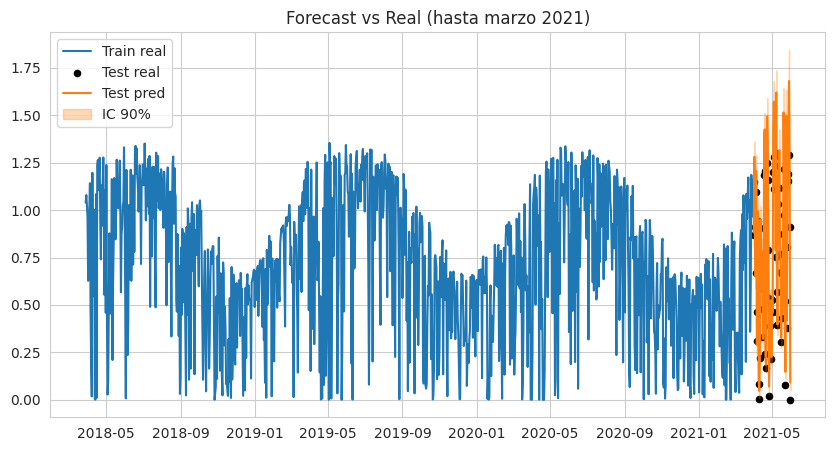

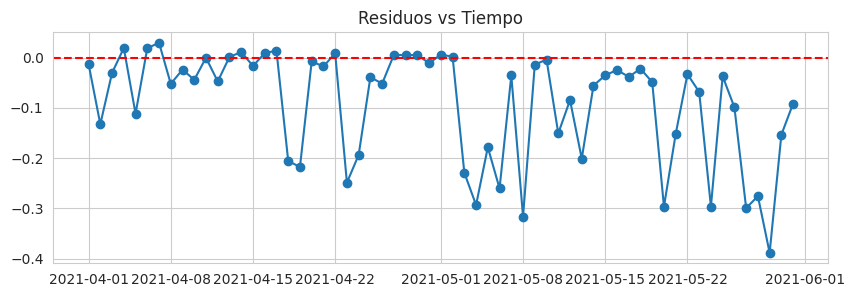

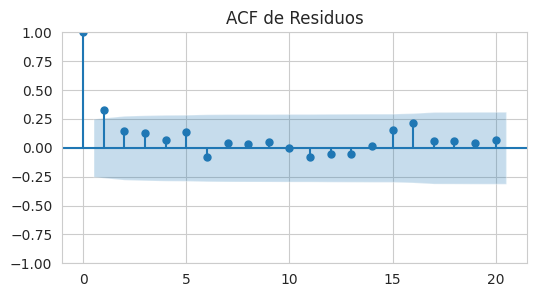

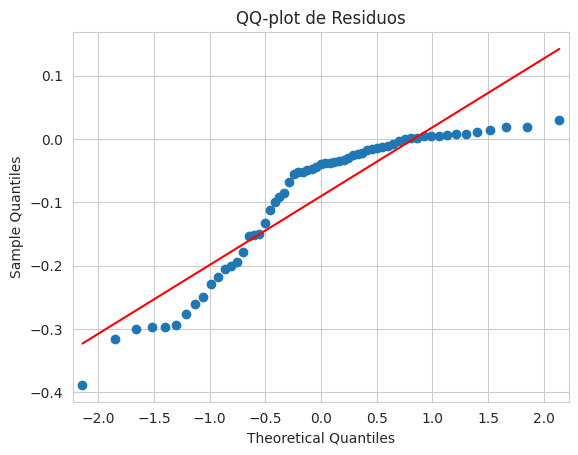

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from prophet import Prophet

# 1. Split temporal
cutoff = pd.to_datetime('2021-03-31')
train = daily[daily['ds'] <= cutoff].copy()
test  = daily[daily['ds']  > cutoff].copy()

# 2. Re-entrena con train
m = Prophet(
    growth="linear",
    changepoint_prior_scale=best_params['changepoint_prior_scale'],
    seasonality_prior_scale=best_params['seasonality_prior_scale'],
    seasonality_mode=best_params['seasonality_mode'],
    mcmc_samples=best_params['mcmc_samples'],
    interval_width=0.90
)
m.add_seasonality("anio", period=365.25, fourier_order=10)
m.add_seasonality("semana", period=7,       fourier_order=8)
for c in reg_cols:
    m.add_regressor(c)

m.fit(train[['ds','y'] + reg_cols])

# 3. Predicción sobre test
future = test[['ds'] + reg_cols]
fcst   = m.predict(future)

# 4. Des-log y residuos
y_real = np.expm1(test['y'].values)
y_pred = np.expm1(fcst['yhat'].values)
lower  = np.expm1(fcst['yhat_lower'].values)
upper  = np.expm1(fcst['yhat_upper'].values)
resid  = y_real - y_pred

# 5. Forecast vs real
plt.figure(figsize=(10,5))
plt.plot(train['ds'], np.expm1(train['y']), label='Train real')
plt.scatter(test['ds'], y_real, color='black', s=20, label='Test real')
plt.plot(test['ds'], y_pred,   color='C1',      label='Test pred')
plt.fill_between(test['ds'], lower, upper, color='C1', alpha=0.3, label='IC 90%')
plt.legend(); plt.title('Forecast vs Real (hasta marzo 2021)'); plt.show()

# 6. Residuos vs tiempo
plt.figure(figsize=(10,3))
plt.plot(test['ds'], resid, marker='o')
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuos vs Tiempo'); plt.show()

# 7. ACF de residuos
fig, ax = plt.subplots(figsize=(6,3))
sm.graphics.tsa.plot_acf(resid, lags=20, ax=ax)
ax.set_title('ACF de Residuos')
plt.show()

# 8. QQ-plot de residuos
fig = sm.qqplot(resid, line='s')
plt.title('QQ-plot de Residuos')
plt.show()
